# Main Pipeline Benchmark Notebook

This notebook mirrors the active `main.py` experiment flow in a notebook format.

Pipeline:
1. Load data
2. Create sliding windows
3. Train all registered models from the current factory
4. Generate samples
5. Compute the same evaluation metrics
6. Plot and compare the models


In [1]:
import os
import sys
import time
import random
import warnings
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch

from IPython.display import display

PROJECT_ROOT = Path.cwd()
if (PROJECT_ROOT / 'main.py').exists():
    sys.path.insert(0, str(PROJECT_ROOT))
else:
    PROJECT_ROOT = Path('/home/wan/psc/sbts_advanced')
    sys.path.insert(0, str(PROJECT_ROOT))

from data.loaders import load_etf_data, load_synthetic_data, create_sliding_windows
from models.factory import get_model, get_default_config, list_models
from metrics import discriminative_score_metrics, discriminative_score_cnn_metrics, predictive_score_metrics
from metrics.numba_metrics import compute_all_metrics_numba, compute_stylized_facts_numba
from visualization import set_style

warnings.filterwarnings('ignore')
set_style()


## Configuration

By default this notebook runs all models currently registered in `models.factory`.
If the full run is too heavy, replace `MODELS_TO_RUN` with a smaller subset.


In [2]:
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)
TORCH_DEVICE = 'cuda'
if TORCH_DEVICE == 'cuda' and not torch.cuda.is_available():
    raise RuntimeError('TORCH_DEVICE is set to cuda, but CUDA is not available in this environment.')
print('Torch device:', TORCH_DEVICE)

# Choose the dataset used by the benchmark loop below.
# Options: 'merton', 'ou_standard', 'ou_high_frequency', 'stock'.
# 'google' is still accepted as a backward-compatible alias for 'stock'.
BENCHMARK_DATASET = 'stock'

# Used when BENCHMARK_DATASET is 'stock' or 'google'.
# Examples: 'GOOGL', 'SPY', 'QQQ'. Any single yfinance ticker should work.
STOCK_TICKER = 'QQQ'
PREPARE_SIMULATED_DATASETS = True
PLOT_DATASET_SAMPLES = True

# Visual real-vs-generated path comparison settings.
# For stock data, use a feature name such as 'Close' or 'Adj Close'.
# For one-dimensional simulated data, this automatically falls back to feature index 0.
VISUAL_COMPARISON_FEATURE = 'Close'
VISUAL_COMPARISON_N_PATHS = 5
VISUAL_COMPARISON_MAX_MODELS = None  # set an integer, e.g. 4, to plot only the top-ranked models
SAVE_VISUAL_COMPARISON_FIGURES = True

# MODELS_TO_RUN = list(list_models().keys())
# Example lighter subset:
MODELS_TO_RUN = ['jd_sbts', 'jd_sbts_f', 'jd_sbts_neural', 'lightsb', 'timegan','diffusion_ts','numba_sb']

DATASET_CONFIGS = {
    'merton': {
        'M': 1000,
        'N': 59,
        'dt': 1 / 252,
        'N_pi': 100,
        'Y0': 1.0,
        'a': 0.0,
        'b': 2.0,
        'lambda_eta': 10.0,
        'm_J': 0.0,
        'v_J': 0.8,
        'representation': 'path',  # 'path' -> (M, N + 1, 1); 'increments' -> (M, N, 1)
        'train_frac': 0.70,
        'val_frac': 0.15,
        'shuffle': True,
    },
    'ou_standard': {
        'M': 1000,
        'N': 59,
        'dt': 1 / 252,
        'theta': 100.0,
        'a': 1.0,
        'b': 10.0,
        'Y0': 1.0,
        'representation': 'path',
        'train_frac': 0.70,
        'val_frac': 0.15,
        'shuffle': True,
    },
    'ou_high_frequency': {
        'M': 1000,
        'N': 59,
        'dt': (1 / 252) * (1 / 10),
        'theta': 100.0,
        'a': 1.0,
        'b': 10.0,
        'Y0': 1.0,
        'representation': 'path',
        'train_frac': 0.70,
        'val_frac': 0.15,
        'shuffle': True,
    },
    'stock': {
        'ticker': STOCK_TICKER,
        'start_date': '2006-01-01',
        'end_date': '2026-03-31',
        'interval': '1d',  # use '1h' for hourly data when Yahoo Finance availability permits
        'features': ['Close'],
        'window_length': 24,
        'stride': 1,
        'normalization': 'log_return',  # 'log_return', 'base_one', 'standard', or 'none'
        'train_frac': 0.70,
        'val_frac': 0.15,
        'shuffle': True,
    },
}

# Backward-compatible alias for older runs that used BENCHMARK_DATASET = 'google'.
DATASET_CONFIGS['google'] = DATASET_CONFIGS['stock'].copy()

TRAINING_OVERRIDES = {
    'seed': SEED,
    'verbose': False,
    'device': TORCH_DEVICE,

    'lstm_hidden': 64,
    'lstm_epochs': 50,
    'lstm_dropout': 0.2,
    'lstm_seq_len': 20,
    'neural_jump_hidden_dim': 32,
    'neural_jump_epochs': 20,
    'jump_threshold_std': 3.0,
    'jump_diagnostic_threshold_std': 4.0,

    # LightSB
    'lightsb_n_potentials': 10,
    'lightsb_epochs': 50,
    'lightsb_batch_size': 128,
    'lightsb_sampling_batch_size': 256,

    # Path LightSB
    'lightsb_path_n_potentials': 10,
    'lightsb_path_epochs': 50,
    'lightsb_path_batch_size': 128,
    'lightsb_path_sampling_batch_size': 256,

    # TimeGAN
    'timegan_hidden_dim': 32,
    'timegan_z_dim': 16,
    'timegan_n_layers': 2,
    'timegan_epochs': 60,
    'timegan_batch_size': 64,

    # Diffusion
    'diffusion_hidden_dim': 64,
    'diffusion_n_steps': 50,
    'diffusion_epochs': 60,
    'diffusion_batch_size': 64,

    # RNN
    'rnn_hidden_dim': 32,
    'rnn_num_layers': 1,
    'rnn_dropout': 0.0,
    'rnn_epochs': 60,
    'rnn_batch_size': 64,
    'rnn_context_len': 1,

    # Transformer AR
    'transformer_ar_d_model': 32,
    'transformer_ar_n_heads': 4,
    'transformer_ar_n_layers': 1,
    'transformer_ar_d_ff': 64,
    'transformer_ar_dropout': 0.1,
    'transformer_ar_epochs': 60,
    'transformer_ar_batch_size': 64,
    'transformer_ar_context_len': 1,

    'n_generate': 512,
    'evaluation_sample_cap': 512,
    'acf_max_lag': 20,

    # Post-hoc discriminative score evaluators
    'discriminative_iterations': 200,
    'discriminative_repeats': 5,
    'discriminative_train_rate': 0.7,
    'discriminative_hidden_dim': 8,
    'discriminative_num_layers': 1,
    'discriminative_batch_size': 32,
    'cnn_discriminative_iterations': 150,
    'cnn_discriminative_repeats': 5,
    'cnn_discriminative_channels': (8, 16),
    'cnn_discriminative_batch_size': 32,

    # Post-hoc predictive score evaluator
    'predictive_iterations': 250,
    'predictive_hidden_dim': 8,
    'predictive_num_layers': 1,
    'predictive_batch_size': 32,

    # Turing-test discriminator diagnostics
    'turing_test_enabled': True,
    'turing_test_epochs': 20,
    'turing_test_hidden_dim': 32,
    'turing_test_batch_size': 64,
    'turing_test_test_size': 0.3,
}


FAIR_COMPARISON = {
    'enabled': True,
    'shared_eval_subset': True,
    'shared_conditioning': True,
    'reset_seed_per_model': True,
}

OUTPUT_DIR = PROJECT_ROOT / 'notebook_outputs' / 'benchmark_main_pipeline'
DATASET_OUTPUT_DIR = OUTPUT_DIR / 'datasets'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
DATASET_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print('Models to run:', MODELS_TO_RUN)
print('Benchmark dataset:', BENCHMARK_DATASET)
print('Output dir:', OUTPUT_DIR)
print('Dataset output dir:', DATASET_OUTPUT_DIR)
print('Fair comparison settings:', FAIR_COMPARISON)


Torch device: cuda
Models to run: ['jd_sbts', 'jd_sbts_f', 'jd_sbts_neural', 'lightsb', 'timegan', 'diffusion_ts', 'numba_sb']
Benchmark dataset: stock
Output dir: /home/wan/psc/sbts_advanced/notebook_outputs/benchmark_main_pipeline
Dataset output dir: /home/wan/psc/sbts_advanced/notebook_outputs/benchmark_main_pipeline/datasets
Fair comparison settings: {'enabled': True, 'shared_eval_subset': True, 'shared_conditioning': True, 'reset_seed_per_model': True}


## Paper Dataset Utilities

The simulators below follow the paper settings requested for the Merton jump-diffusion process, the standard and high-frequency OU processes, and the configurable yfinance stock/ETF dataset. Simulated paths use `N` as the number of observation intervals and return `N + 1` observations including `Y0`; increment windows therefore have length `N`.


In [3]:
def _json_default(value):
    if isinstance(value, Path):
        return str(value)
    if isinstance(value, (np.integer, np.floating, np.bool_)):
        return value.item()
    if isinstance(value, np.ndarray):
        return value.tolist()
    if isinstance(value, pd.Timestamp):
        return str(value)
    raise TypeError(f'Object of type {type(value).__name__} is not JSON serializable')


def compute_increments(paths):
    """Return first differences along the time axis."""
    return np.diff(np.asarray(paths), axis=1)


def create_train_val_test_splits(data, train_frac=0.70, val_frac=0.15, shuffle=True, seed=42):
    """Split an array on its first axis and keep the split indices for reproducibility."""
    if not 0 < train_frac < 1:
        raise ValueError('train_frac must be in (0, 1)')
    if not 0 <= val_frac < 1:
        raise ValueError('val_frac must be in [0, 1)')
    if train_frac + val_frac >= 1:
        raise ValueError('train_frac + val_frac must be less than 1')

    n_items = len(data)
    indices = np.arange(n_items)
    if shuffle:
        rng = np.random.default_rng(seed)
        rng.shuffle(indices)

    n_train = int(np.floor(train_frac * n_items))
    n_val = int(np.floor(val_frac * n_items))
    train_idx = indices[:n_train]
    val_idx = indices[n_train:n_train + n_val]
    test_idx = indices[n_train + n_val:]

    return {
        'train': data[train_idx],
        'val': data[val_idx],
        'test': data[test_idx],
        'indices': {
            'train': train_idx,
            'val': val_idx,
            'test': test_idx,
        },
    }


def save_dataset_arrays(dataset_dir, raw_paths=None, increments=None, processed_windows=None, splits=None, metadata=None):
    """Save raw simulated paths, increments, processed windows, and split arrays."""
    dataset_dir = Path(dataset_dir)
    dataset_dir.mkdir(parents=True, exist_ok=True)

    if raw_paths is not None:
        np.save(dataset_dir / 'raw_paths.npy', raw_paths)
    if increments is not None:
        np.save(dataset_dir / 'increments.npy', increments)
    if processed_windows is not None:
        np.save(dataset_dir / 'processed_windows.npy', processed_windows)
    if splits is not None:
        for split_name in ['train', 'val', 'test']:
            np.save(dataset_dir / f'{split_name}_windows.npy', splits[split_name])
        np.savez_compressed(dataset_dir / 'split_indices.npz', **splits['indices'])
    if metadata is not None:
        with open(dataset_dir / 'metadata.json', 'w') as f:
            json.dump(metadata, f, indent=2, default=_json_default)


def simulate_merton_jump_diffusion(
    M=1000,
    N=100,
    dt=1 / 252,
    N_pi=100,
    Y0=1.0,
    a=0.0,
    b=2.0,
    lambda_eta=10.0,
    m_J=0.0,
    v_J=0.8,
    seed=42,
):
    """
    Simulate 1D Merton jump-diffusion paths.

    Returns an array with shape (M, N + 1). The first column is Y0 and the
    remaining N columns are observations spaced by dt. Each dt interval is
    simulated using N_pi Euler substeps.

    Sign rule: jumps are sampled as negative magnitudes when the current state
    is above Y0 and positive magnitudes when it is below Y0. At exactly Y0, the
    sign is sampled symmetrically to avoid a deterministic bias.
    """
    rng = np.random.default_rng(seed)
    sub_dt = dt / N_pi
    sqrt_sub_dt = np.sqrt(sub_dt)

    paths = np.empty((M, N + 1), dtype=np.float64)
    paths[:, 0] = Y0
    y = np.full(M, Y0, dtype=np.float64)

    for obs_idx in range(1, N + 1):
        for _ in range(N_pi):
            dW = rng.standard_normal(M) * sqrt_sub_dt
            jump_counts = rng.poisson(lambda_eta * sub_dt, size=M)
            jump_update = np.zeros(M, dtype=np.float64)

            if jump_counts.any():
                max_jumps = int(jump_counts.max())
                raw_magnitudes = np.abs(rng.normal(m_J, v_J, size=(M, max_jumps)))
                active_jump = np.arange(max_jumps)[None, :] < jump_counts[:, None]
                random_sign = rng.choice(np.array([-1.0, 1.0]), size=M)
                jump_sign = np.where(y > Y0, -1.0, np.where(y < Y0, 1.0, random_sign))
                jump_update = (jump_sign[:, None] * raw_magnitudes * active_jump).sum(axis=1)

            y = y + a * sub_dt + b * dW + jump_update

        paths[:, obs_idx] = y

    return paths


def simulate_ou_process(M=1000, N=100, dt=1 / 252, theta=100.0, a=1.0, b=10.0, Y0=1.0, seed=42):
    """
    Euler-Maruyama simulator for dY_t = theta (a - Y_t) dt + b dW_t.

    Returns an array with shape (M, N + 1), including Y0 at index 0.
    """
    rng = np.random.default_rng(seed)
    paths = np.empty((M, N + 1), dtype=np.float64)
    paths[:, 0] = Y0

    for step in range(1, N + 1):
        prev = paths[:, step - 1]
        dW = rng.standard_normal(M) * np.sqrt(dt)
        paths[:, step] = prev + theta * (a - prev) * dt + b * dW

    return paths


def plot_sample_trajectories(paths, n=8, title='Sample trajectories', dt=None, feature=0):
    """Plot a few paths from a 2D path array or 3D window array."""
    arr = np.asarray(paths)
    if arr.ndim == 3:
        arr = arr[:, :, feature]
    if arr.ndim != 2:
        raise ValueError('paths must have shape (samples, steps) or (samples, steps, features)')

    n_plot = min(n, arr.shape[0])
    x_axis = np.arange(arr.shape[1]) if dt is None else np.arange(arr.shape[1]) * dt

    fig, ax = plt.subplots(figsize=(10, 4))
    for idx in range(n_plot):
        ax.plot(x_axis, arr[idx], linewidth=1.2, alpha=0.85)
    ax.set_title(title)
    ax.set_xlabel('Time' if dt is not None else 'Time step')
    ax.set_ylabel('Value')
    plt.tight_layout()
    plt.show()
    return ax


def compute_summary_statistics(paths):
    """Compute mean, std, increment std, and empirical quadratic variation."""
    arr = np.asarray(paths, dtype=np.float64)
    inc = compute_increments(arr)
    qv_by_path = np.sum(inc ** 2, axis=1)
    return {
        'mean': float(np.mean(arr)),
        'std': float(np.std(arr, ddof=1)),
        'increment_std': float(np.std(inc, ddof=1)),
        'empirical_quadratic_variation': float(np.mean(qv_by_path)),
    }


def _time_grid_from_config(config, length, representation):
    dt = config.get('dt')
    if dt is None:
        return np.arange(length)
    if representation == 'increments':
        return np.arange(1, length + 1) * dt
    return np.arange(length) * dt


def _build_simulated_dataset(name, config, output_root, seed):
    dataset_dir = Path(output_root) / name
    representation = config.get('representation', 'path')

    if name == 'merton':
        paths = simulate_merton_jump_diffusion(
            M=config['M'],
            N=config['N'],
            dt=config['dt'],
            N_pi=config['N_pi'],
            Y0=config['Y0'],
            a=config['a'],
            b=config['b'],
            lambda_eta=config['lambda_eta'],
            m_J=config['m_J'],
            v_J=config['v_J'],
            seed=seed,
        )
        process = 'Merton jump-diffusion'
    elif name in {'ou_standard', 'ou_high_frequency'}:
        paths = simulate_ou_process(
            M=config['M'],
            N=config['N'],
            dt=config['dt'],
            theta=config['theta'],
            a=config['a'],
            b=config['b'],
            Y0=config['Y0'],
            seed=seed,
        )
        process = 'Ornstein-Uhlenbeck'
    else:
        raise ValueError(f'Unknown simulated dataset: {name}')

    increments = compute_increments(paths)
    path_windows = paths[:, :, None]
    increment_windows = increments[:, :, None]

    if representation == 'path':
        processed_windows = path_windows
    elif representation == 'increments':
        processed_windows = increment_windows
    else:
        raise ValueError("representation must be 'path' or 'increments'")

    splits = create_train_val_test_splits(
        processed_windows,
        train_frac=config.get('train_frac', 0.70),
        val_frac=config.get('val_frac', 0.15),
        shuffle=config.get('shuffle', True),
        seed=seed,
    )
    stats = compute_summary_statistics(paths)

    metadata = {
        'dataset': name,
        'process': process,
        'path_shape': paths.shape,
        'increments_shape': increments.shape,
        'processed_windows_shape': processed_windows.shape,
        'processed_windows_documentation': "shape is (num_windows, steps, features); features=1; path mode includes Y0 and has N+1 steps; increments mode has N steps",
        'representation': representation,
        'config': config,
        'summary_statistics': stats,
    }

    save_dataset_arrays(
        dataset_dir,
        raw_paths=paths,
        increments=increments,
        processed_windows=processed_windows,
        splits=splits,
        metadata=metadata,
    )
    pd.Series(stats, name='value').to_csv(dataset_dir / 'summary_statistics.csv')

    return {
        'name': name,
        'raw_data': path_windows,
        'raw_paths': paths,
        'increments': increments,
        'processed_windows': processed_windows,
        'splits': splits,
        'time_grid': _time_grid_from_config(config, processed_windows.shape[1], representation),
        'metadata': metadata,
        'dataset_dir': dataset_dir,
    }


def _normalize_stock_windows(windows, method='base_one', eps=1e-8):
    method = method.lower()
    windows = np.asarray(windows, dtype=np.float64)

    if method == 'none':
        return windows, {'method': 'none'}

    if method == 'base_one':
        first_values = windows[:, :1, :]
        safe_denominator = np.where(np.abs(first_values) > eps, first_values, 1.0)
        normalized = windows / safe_denominator
        return normalized, {
            'method': 'base_one',
            'zero_first_value_count': int(np.sum(np.abs(first_values) <= eps)),
        }

    if method == 'log_return':
        safe_windows = np.maximum(windows, eps)
        log_returns = np.diff(np.log(safe_windows), axis=1)
        return log_returns, {
            'method': 'log_return',
            'non_positive_value_count': int(np.sum(windows <= eps)),
        }

    if method == 'standard':
        mean = windows.mean(axis=1, keepdims=True)
        std = windows.std(axis=1, keepdims=True, ddof=0)
        zero_std_count = int(np.sum(std <= eps))
        safe_std = np.where(std > eps, std, 1.0)
        normalized = (windows - mean) / safe_std
        return normalized, {
            'method': 'standard',
            'zero_std_count': zero_std_count,
        }

    raise ValueError("normalization must be one of: 'log_return', 'base_one', 'standard', 'none'")


def download_stock_data(ticker='GOOGL', start_date='2004-01-01', end_date='2019-12-31', interval='1d', features=None, raw_csv_path=None):
    """Download configurable stock or ETF data with yfinance and keep the requested features."""
    try:
        import yfinance as yf
    except ImportError as exc:
        raise ImportError('yfinance is required for the stock dataset. Install it with: pip install yfinance') from exc

    features = features or ['Close']
    inclusive_end = (pd.Timestamp(end_date) + pd.Timedelta(days=1)).strftime('%Y-%m-%d')

    downloaded = yf.download(
        ticker,
        start=start_date,
        end=inclusive_end,
        interval=interval,
        progress=False,
        auto_adjust=False,
    )
    if downloaded.empty:
        raise ValueError(f'No data downloaded for {ticker} between {start_date} and {end_date}')

    if isinstance(downloaded.columns, pd.MultiIndex):
        if ticker in downloaded.columns.get_level_values(-1):
            downloaded = downloaded.xs(ticker, axis=1, level=-1)
        elif ticker in downloaded.columns.get_level_values(0):
            downloaded = downloaded.xs(ticker, axis=1, level=0)

    missing_cols = [col for col in features if col not in downloaded.columns]
    if missing_cols:
        raise ValueError(f'Missing expected columns for {ticker}: {missing_cols}')

    df = downloaded.loc[:, features].copy()
    df = df.sort_index()
    df = df.replace([np.inf, -np.inf], np.nan)
    rows_before = len(df)
    df = df.dropna(axis=0, how='any')
    dropped_rows = rows_before - len(df)

    if raw_csv_path is not None:
        raw_csv_path = Path(raw_csv_path)
        raw_csv_path.parent.mkdir(parents=True, exist_ok=True)
        df.to_csv(raw_csv_path)

    return df, {
        'ticker': ticker,
        'requested_start_date': start_date,
        'requested_end_date': end_date,
        'interval': interval,
        'actual_start_date': str(df.index.min().date()),
        'actual_end_date': str(df.index.max().date()),
        'valid_rows': int(len(df)),
        'dropped_rows_missing_or_infinite': int(dropped_rows),
        'features': list(features),
    }


def create_stock_sliding_windows(frame, window_length=60, stride=5):
    """Convert a full stock time series DataFrame to overlapping windows."""
    values = frame.to_numpy(dtype=np.float64)
    stride = int(stride)
    if stride <= 0:
        raise ValueError(f'stride must be positive, got {stride}')
    if len(values) < window_length:
        raise ValueError(f'Need at least {window_length} rows, got {len(values)}')
    return np.stack([values[start:start + window_length] for start in range(0, len(values) - window_length + 1, stride)])


def _sanitize_ticker_for_path(ticker):
    safe = ''.join(ch if ch.isalnum() else '_' for ch in str(ticker).upper()).strip('_')
    return safe or 'TICKER'


def _build_stock_dataset(config, output_root, seed, dataset_name='stock'):
    ticker = str(config.get('ticker', 'GOOGL')).upper()
    safe_ticker = _sanitize_ticker_for_path(ticker)
    dataset_dir = Path(output_root) / f'{dataset_name}_{safe_ticker}'
    raw_csv_path = dataset_dir / f'{safe_ticker}_raw_daily.csv'
    df, download_report = download_stock_data(
        ticker=ticker,
        start_date=config.get('start_date', '2004-01-01'),
        end_date=config.get('end_date', '2019-12-31'),
        interval=config.get('interval', '1d'),
        features=config.get('features'),
        raw_csv_path=raw_csv_path,
    )

    target_window_length = int(config.get('window_length', 60))
    stride = int(config.get('stride', 5))
    normalization = config.get('normalization', 'base_one')
    raw_window_length = target_window_length + 1 if normalization == 'log_return' else target_window_length
    raw_windows = create_stock_sliding_windows(df, window_length=raw_window_length, stride=stride)
    processed_windows, normalization_report = _normalize_stock_windows(
        raw_windows,
        method=normalization,
    )
    if processed_windows.shape[1] != target_window_length:
        raise ValueError(
            f"Expected processed stock windows of length {target_window_length}, "
            f"got {processed_windows.shape[1]}"
        )
    splits = create_train_val_test_splits(
        processed_windows,
        train_frac=config.get('train_frac', 0.70),
        val_frac=config.get('val_frac', 0.15),
        shuffle=config.get('shuffle', True),
        seed=seed,
    )

    metadata = {
        'dataset': dataset_name,
        'source': 'yfinance',
        'ticker': ticker,
        'output_shape_documentation': f'processed_windows shape is {processed_windows.shape}',
        'raw_csv_path': raw_csv_path,
        'raw_windows_shape': raw_windows.shape,
        'processed_windows_shape': processed_windows.shape,
        'stride': stride,
        'download_report': download_report,
        'normalization_report': normalization_report,
        'config': config,
    }

    save_dataset_arrays(
        dataset_dir,
        raw_paths=None,
        increments=None,
        processed_windows=processed_windows,
        splits=splits,
        metadata=metadata,
    )
    np.save(dataset_dir / 'raw_windows.npy', raw_windows)

    print('Stock dataset report')
    print(f"- ticker: {download_report['ticker']}")
    print(f"- date range: {download_report['actual_start_date']} to {download_report['actual_end_date']}")
    print(f"- interval: {download_report['interval']}")
    print(f"- valid rows: {download_report['valid_rows']}")
    print(f"- stride: {stride}")
    print(f"- windows: {processed_windows.shape[0]}")
    print(f"- features: {download_report['features']}")
    print(f"- normalization: {normalization_report['method']}")

    return {
        'name': dataset_name,
        'raw_data': df.to_numpy(dtype=np.float64)[None, :, :],
        'raw_frame': df,
        'raw_windows': raw_windows,
        'processed_windows': processed_windows,
        'splits': splits,
        'time_grid': np.arange(processed_windows.shape[1]),
        'metadata': metadata,
        'dataset_dir': dataset_dir,
    }


def build_benchmark_dataset(name, config, output_root, seed=42):
    """Build, save, and return one benchmark dataset bundle."""
    if name in {'merton', 'ou_standard', 'ou_high_frequency'}:
        return _build_simulated_dataset(name, config, output_root, seed)
    if name in {'stock', 'google'}:
        return _build_stock_dataset(config, output_root, seed, dataset_name=name)
    raise ValueError(f'Unknown BENCHMARK_DATASET: {name}')


## Prepare Benchmark Dataset

This cell builds the requested paper dataset, saves raw and processed arrays under `notebook_outputs/benchmark_main_pipeline/datasets`, and exposes train windows through `data` for the unchanged model benchmark loop.


Prepared merton: processed_windows=(1000, 60, 1), saved_to=/home/wan/psc/sbts_advanced/notebook_outputs/benchmark_main_pipeline/datasets/merton
Prepared ou_standard: processed_windows=(1000, 60, 1), saved_to=/home/wan/psc/sbts_advanced/notebook_outputs/benchmark_main_pipeline/datasets/ou_standard
Prepared ou_high_frequency: processed_windows=(1000, 60, 1), saved_to=/home/wan/psc/sbts_advanced/notebook_outputs/benchmark_main_pipeline/datasets/ou_high_frequency
Stock dataset report
- ticker: QQQ
- date range: 2006-01-03 to 2026-03-31
- interval: 1d
- valid rows: 5092
- stride: 1
- windows: 5068
- features: ['Close']
- normalization: log_return
Selected dataset: stock
Metadata: {'dataset': 'stock', 'source': 'yfinance', 'ticker': 'QQQ', 'output_shape_documentation': 'processed_windows shape is (5068, 24, 1)', 'raw_csv_path': PosixPath('/home/wan/psc/sbts_advanced/notebook_outputs/benchmark_main_pipeline/datasets/stock_QQQ/QQQ_raw_daily.csv'), 'raw_windows_shape': (5068, 25, 1), 'processed

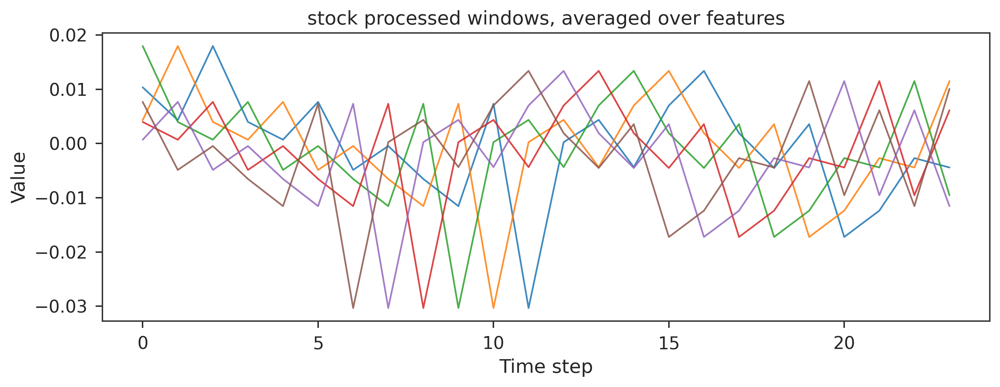

In [4]:
prepared_datasets = {}
if PREPARE_SIMULATED_DATASETS:
    for dataset_name in ['merton', 'ou_standard', 'ou_high_frequency']:
        prepared_datasets[dataset_name] = build_benchmark_dataset(
            dataset_name,
            DATASET_CONFIGS[dataset_name],
            DATASET_OUTPUT_DIR,
            seed=SEED,
        )
        print(
            f"Prepared {dataset_name}: "
            f"processed_windows={prepared_datasets[dataset_name]['processed_windows'].shape}, "
            f"saved_to={prepared_datasets[dataset_name]['dataset_dir']}"
        )

if BENCHMARK_DATASET in prepared_datasets:
    dataset_bundle = prepared_datasets[BENCHMARK_DATASET]
else:
    dataset_bundle = build_benchmark_dataset(
        BENCHMARK_DATASET,
        DATASET_CONFIGS[BENCHMARK_DATASET],
        DATASET_OUTPUT_DIR,
        seed=SEED,
    )

metadata = dataset_bundle['metadata']
raw_data = dataset_bundle['raw_data']
data_splits = dataset_bundle['splits']
data = data_splits['train'].astype(np.float32)
eval_pool = data_splits['test']
if len(eval_pool) == 0:
    eval_pool = data_splits['val']
if len(eval_pool) == 0:
    eval_pool = data

time_grid = np.asarray(dataset_bundle['time_grid'], dtype=np.float64)
if len(time_grid) != data.shape[1]:
    time_grid = np.linspace(0, 1, data.shape[1])

n_generate = min(TRAINING_OVERRIDES['n_generate'], len(eval_pool))
shared_eval_subset = eval_pool[:n_generate].astype(np.float32).copy()

print('Selected dataset:', BENCHMARK_DATASET)
print('Metadata:', metadata)
print('Raw data shape:', raw_data.shape)
print('Train window shape:', data.shape)
print('Validation window shape:', data_splits['val'].shape)
print('Test window shape:', data_splits['test'].shape)
print('Time grid length:', len(time_grid))
print('Samples for generation/evaluation:', n_generate)
print('Shared evaluation subset shape:', shared_eval_subset.shape)

if PLOT_DATASET_SAMPLES:
    if 'raw_paths' in dataset_bundle:
        plot_sample_trajectories(
            dataset_bundle['raw_paths'],
            n=6,
            title=f'{BENCHMARK_DATASET} raw simulated paths',
            dt=DATASET_CONFIGS[BENCHMARK_DATASET].get('dt'),
        )
    else:
        plot_sample_trajectories(
            np.mean(dataset_bundle['processed_windows'][:6], axis=2, keepdims=True),
            n=6,
            title=f'{BENCHMARK_DATASET} processed windows, averaged over features',
            feature=0,
        )


## Train, Generate, Evaluate

In [5]:
def extract_metric_value(result, key, default):
    if isinstance(result, dict):
        return float(result.get(key, default))
    if np.isscalar(result):
        return float(result)
    return float(default)


def reset_generation_seed(seed):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


CONDITIONED_X0_MODELS = {'jd_sbts', 'jd_sbts_f', 'jd_sbts_neural', 'jd_sbts_f_neural', 'lightsb_path'}
CONDITIONED_PREFIX_MODELS = {'rnn', 'transformer_ar'}
WINDOW_LEVEL_NOISE_MODELS = {'lightsb'}
UNCONDITIONAL_MODELS = {'timegan', 'diffusion_ts'}


class DiagnosticDiscriminator(torch.nn.Module):
    """Small GRU classifier used only for post-hoc discriminative diagnostics."""

    def __init__(self, input_size, hidden_size=8, num_layers=1, dropout=0.0):
        super().__init__()
        self.rnn = torch.nn.GRU(
            input_size,
            hidden_size,
            num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0,
        )
        self.fc = torch.nn.Linear(hidden_size, 1)

    def forward(self, x):
        _, states = self.rnn(x)
        logits = self.fc(states[-1])
        probs = torch.sigmoid(logits)
        return logits, probs


class DiagnosticCNNDiscriminator(torch.nn.Module):
    """Small 1D-CNN classifier for local-shape discriminative diagnostics."""

    def __init__(self, input_size, channels=(8, 16)):
        super().__init__()
        c1, c2 = [int(c) for c in channels]
        self.net = torch.nn.Sequential(
            torch.nn.Conv1d(input_size, c1, kernel_size=3, padding=1),
            torch.nn.ReLU(),
            torch.nn.Conv1d(c1, c2, kernel_size=3, padding=1),
            torch.nn.ReLU(),
            torch.nn.AdaptiveAvgPool1d(1),
        )
        self.fc = torch.nn.Linear(c2, 1)

    def forward(self, x):
        h = self.net(x.transpose(1, 2)).squeeze(-1)
        logits = self.fc(h)
        probs = torch.sigmoid(logits)
        return logits, probs


class DiagnosticPredictor(torch.nn.Module):
    """Small GRU forecaster used only for post-hoc predictive score."""

    def __init__(self, input_size, hidden_size=8, output_size=1, num_layers=1):
        super().__init__()
        self.rnn = torch.nn.GRU(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = torch.nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.rnn(x)
        return self.fc(out[:, -1, :])


def _ensure_3d_tensor(data, device):
    arr = np.asarray(data, dtype=np.float32)
    if arr.ndim == 2:
        arr = arr[:, :, None]
    if arr.ndim != 3:
        raise ValueError(f'discriminative diagnostics require 2D or 3D data, got shape {arr.shape}')
    return torch.tensor(arr, dtype=torch.float32, device=device)


def _balanced_train_test_split(real, generated, train_rate=0.8):
    n_real = len(real)
    n_gen = len(generated)
    real_idx = np.random.permutation(n_real)
    gen_idx = np.random.permutation(n_gen)
    n_train_real = int(n_real * train_rate)
    n_train_gen = int(n_gen * train_rate)

    return {
        'train_real': real[real_idx[:n_train_real]],
        'test_real': real[real_idx[n_train_real:]],
        'train_gen': generated[gen_idx[:n_train_gen]],
        'test_gen': generated[gen_idx[n_train_gen:]],
    }


def _sample_batch(data, batch_size):
    idx = torch.randperm(len(data), device=data.device)[:batch_size]
    return data[idx]


def predictive_score_diagnostics(
    real_data,
    generated_data,
    iterations=250,
    hidden_dim=8,
    num_layers=1,
    batch_size=32,
    seed=42,
    device=None,
):
    """Train a small predictor on generated windows and report MAE on real windows."""
    device = device or torch.device(TRAINING_OVERRIDES.get('device', 'cuda'))
    torch.manual_seed(int(seed))
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(int(seed))

    real = _ensure_3d_tensor(real_data, device)
    generated = _ensure_3d_tensor(generated_data, device)
    n_real, seq_len, dim = real.shape
    n_gen = generated.shape[0]
    if n_real < 2 or n_gen < 2 or seq_len < 2:
        raise ValueError('predictive diagnostics require at least 2 samples and seq_len >= 2')

    x_gen = generated[:, :-1, :]
    y_gen = generated[:, -1, :]
    x_real = real[:, :-1, :]
    y_real = real[:, -1, :]

    predictor = DiagnosticPredictor(
        dim,
        hidden_size=int(hidden_dim),
        output_size=dim,
        num_layers=int(num_layers),
    ).to(device)
    optimizer = torch.optim.Adam(predictor.parameters(), lr=0.001)
    criterion = torch.nn.L1Loss()
    batch_size = max(1, min(int(batch_size), len(x_gen)))

    predictor.train()
    for _ in range(int(iterations)):
        idx = torch.randperm(len(x_gen), device=device)[:batch_size]
        batch_x = x_gen[idx]
        batch_y = y_gen[idx]
        optimizer.zero_grad()
        loss = criterion(predictor(batch_x), batch_y)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(predictor.parameters(), 1.0)
        optimizer.step()

    predictor.eval()
    with torch.no_grad():
        mae = criterion(predictor(x_real), y_real).item()

    return {
        'predictive_score': float(mae),
        'predictive_hidden_dim': int(hidden_dim),
        'predictive_num_layers': int(num_layers),
        'predictive_batch_size': int(batch_size),
        'predictive_iterations': int(iterations),
        'predictive_train_generated_n': int(n_gen),
        'predictive_test_real_n': int(n_real),
    }


def discriminative_score_diagnostics(
    real_data,
    generated_data,
    iterations=300,
    repeats=5,
    train_rate=0.8,
    hidden_dim=8,
    num_layers=1,
    batch_size=32,
    seed=42,
    device=None,
):
    """Return repeated discriminative score plus accuracy and prediction-balance diagnostics."""
    device = device or torch.device(TRAINING_OVERRIDES.get('device', 'cuda'))
    real = _ensure_3d_tensor(real_data, device)
    generated = _ensure_3d_tensor(generated_data, device)

    n_real, seq_len, dim = real.shape
    n_gen = generated.shape[0]
    if n_real < 2 or n_gen < 2 or seq_len < 2:
        raise ValueError('discriminative diagnostics require at least 2 samples and seq_len >= 2')

    records = []
    for repeat_idx in range(int(repeats)):
        repeat_seed = int(seed) + repeat_idx
        np.random.seed(repeat_seed)
        torch.manual_seed(repeat_seed)
        if torch.cuda.is_available():
            torch.cuda.manual_seed_all(repeat_seed)

        split = _balanced_train_test_split(real, generated, train_rate=train_rate)
        train_real = split['train_real']
        train_gen = split['train_gen']
        test_real = split['test_real']
        test_gen = split['test_gen']
        current_batch_size = max(1, min(int(batch_size), len(train_real), len(train_gen)))

        discriminator = DiagnosticDiscriminator(
            dim,
            hidden_size=int(hidden_dim),
            num_layers=int(num_layers),
        ).to(device)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        criterion = torch.nn.BCEWithLogitsLoss()

        discriminator.train()
        for _ in range(int(iterations)):
            real_batch = _sample_batch(train_real, current_batch_size)
            gen_batch = _sample_batch(train_gen, current_batch_size)

            optimizer.zero_grad()
            real_logits, _ = discriminator(real_batch)
            gen_logits, _ = discriminator(gen_batch)
            loss = criterion(real_logits, torch.ones_like(real_logits)) + criterion(gen_logits, torch.zeros_like(gen_logits))
            loss.backward()
            optimizer.step()

        discriminator.eval()
        with torch.no_grad():
            _, real_probs = discriminator(test_real)
            _, gen_probs = discriminator(test_gen)

        real_pred = (real_probs.cpu().numpy().reshape(-1) > 0.5).astype(np.int64)
        gen_pred = (gen_probs.cpu().numpy().reshape(-1) > 0.5).astype(np.int64)
        labels = np.concatenate([np.ones_like(real_pred), np.zeros_like(gen_pred)])
        preds = np.concatenate([real_pred, gen_pred])
        accuracy = float(np.mean(preds == labels))
        pred_real_rate = float(np.mean(preds))
        class_balance_gap = abs(pred_real_rate - 0.5)
        score = abs(0.5 - accuracy)
        records.append({
            'score': score,
            'class_balance_gap': class_balance_gap,
            'effective_score': max(score, class_balance_gap),
            'accuracy': accuracy,
            'pred_real_rate': pred_real_rate,
            'pred_real_rate_on_real': float(np.mean(real_pred)) if len(real_pred) else np.nan,
            'pred_real_rate_on_generated': float(np.mean(gen_pred)) if len(gen_pred) else np.nan,
            'test_real_n': int(len(real_pred)),
            'test_generated_n': int(len(gen_pred)),
        })

    frame = pd.DataFrame(records)
    return {
        'gru_discriminative_score': float(frame['score'].mean()),
        'gru_discriminative_score_std': float(frame['score'].std(ddof=0)),
        'gru_discriminative_class_balance_gap': float(frame['class_balance_gap'].mean()),
        'gru_discriminative_effective_score': float(frame['effective_score'].mean()),
        'gru_discriminative_effective_score_std': float(frame['effective_score'].std(ddof=0)),
        'gru_discriminative_accuracy': float(frame['accuracy'].mean()),
        'gru_discriminative_accuracy_std': float(frame['accuracy'].std(ddof=0)),
        'gru_discriminative_pred_real_rate': float(frame['pred_real_rate'].mean()),
        'gru_discriminative_pred_real_rate_on_real': float(frame['pred_real_rate_on_real'].mean()),
        'gru_discriminative_pred_real_rate_on_generated': float(frame['pred_real_rate_on_generated'].mean()),
        'gru_discriminative_test_real_n': int(frame['test_real_n'].iloc[0]),
        'gru_discriminative_test_generated_n': int(frame['test_generated_n'].iloc[0]),
        'gru_discriminative_repeats': int(repeats),
        'gru_discriminative_hidden_dim': int(hidden_dim),
        'gru_discriminative_num_layers': int(num_layers),
        'gru_discriminative_batch_size': int(batch_size),
    }


def cnn_discriminative_score_diagnostics(
    real_data,
    generated_data,
    iterations=300,
    repeats=5,
    train_rate=0.8,
    channels=(8, 16),
    batch_size=32,
    seed=42,
    device=None,
):
    """Return repeated 1D-CNN discriminative score diagnostics."""
    device = device or torch.device(TRAINING_OVERRIDES.get('device', 'cuda'))
    real = _ensure_3d_tensor(real_data, device)
    generated = _ensure_3d_tensor(generated_data, device)
    n_real, seq_len, dim = real.shape
    n_gen = generated.shape[0]
    if n_real < 2 or n_gen < 2 or seq_len < 2:
        raise ValueError('CNN discriminative diagnostics require at least 2 samples and seq_len >= 2')

    scores = []
    for repeat_idx in range(int(repeats)):
        repeat_seed = int(seed) + repeat_idx
        np.random.seed(repeat_seed)
        torch.manual_seed(repeat_seed)
        if torch.cuda.is_available():
            torch.cuda.manual_seed_all(repeat_seed)

        split = _balanced_train_test_split(real, generated, train_rate=train_rate)
        train_real = split['train_real']
        train_gen = split['train_gen']
        test_real = split['test_real']
        test_gen = split['test_gen']
        current_batch_size = max(1, min(int(batch_size), len(train_real), len(train_gen)))

        discriminator = DiagnosticCNNDiscriminator(dim, channels=channels).to(device)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        criterion = torch.nn.BCEWithLogitsLoss()

        discriminator.train()
        for _ in range(int(iterations)):
            real_batch = _sample_batch(train_real, current_batch_size)
            gen_batch = _sample_batch(train_gen, current_batch_size)
            optimizer.zero_grad()
            real_logits, _ = discriminator(real_batch)
            gen_logits, _ = discriminator(gen_batch)
            loss = criterion(real_logits, torch.ones_like(real_logits)) + criterion(gen_logits, torch.zeros_like(gen_logits))
            loss.backward()
            optimizer.step()

        discriminator.eval()
        with torch.no_grad():
            _, real_probs = discriminator(test_real)
            _, gen_probs = discriminator(test_gen)
        real_pred = (real_probs.cpu().numpy().reshape(-1) > 0.5).astype(np.int64)
        gen_pred = (gen_probs.cpu().numpy().reshape(-1) > 0.5).astype(np.int64)
        labels = np.concatenate([np.ones_like(real_pred), np.zeros_like(gen_pred)])
        preds = np.concatenate([real_pred, gen_pred])
        accuracy = float(np.mean(preds == labels))
        scores.append(abs(0.5 - accuracy))

    scores = np.asarray(scores, dtype=np.float64)
    return {
        'cnn_discriminative_score': float(np.mean(scores)),
        'cnn_discriminative_score_std': float(np.std(scores, ddof=0)),
        'cnn_discriminative_repeats': int(repeats),
        'cnn_discriminative_channels': tuple(int(c) for c in channels),
        'cnn_discriminative_batch_size': int(batch_size),
    }


def turing_test_diagnostics(
    real_data,
    generated_data,
    epochs=20,
    hidden_dim=32,
    batch_size=64,
    test_size=0.3,
    seed=42,
    device=None,
):
    """Train a GRU Turing-test discriminator and keep plot-ready diagnostics."""
    device = device or torch.device(TRAINING_OVERRIDES.get('device', 'cuda'))
    torch.manual_seed(int(seed))
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(int(seed))

    real = _ensure_3d_tensor(real_data, device)
    generated = _ensure_3d_tensor(generated_data, device)
    n = min(len(real), len(generated))
    if n < 2:
        raise ValueError('Turing test requires at least 2 real and 2 generated windows')

    real = real[:n]
    generated = generated[:n]
    x = torch.cat([real, generated], dim=0)
    y = torch.cat([torch.ones(n, 1, device=device), torch.zeros(n, 1, device=device)], dim=0)

    generator = torch.Generator(device=device)
    generator.manual_seed(int(seed))
    perm = torch.randperm(len(x), generator=generator, device=device)
    x = x[perm]
    y = y[perm]

    n_test = max(1, int(round(len(x) * float(test_size))))
    n_test = min(n_test, len(x) - 1)
    x_test = x[:n_test]
    y_test = y[:n_test]
    x_train = x[n_test:]
    y_train = y[n_test:]

    discriminator = DiagnosticDiscriminator(
        x.shape[-1],
        hidden_size=int(hidden_dim),
        num_layers=1,
    ).to(device)
    optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
    criterion = torch.nn.BCEWithLogitsLoss()
    batch_size = max(1, min(int(batch_size), len(x_train)))

    loss_history = []
    acc_history = []
    for _ in range(int(epochs)):
        discriminator.train()
        epoch_losses = []
        correct = 0
        total = 0
        train_perm = torch.randperm(len(x_train), generator=generator, device=device)
        for start in range(0, len(x_train), batch_size):
            idx = train_perm[start:start + batch_size]
            batch_x = x_train[idx]
            batch_y = y_train[idx]
            optimizer.zero_grad()
            logits, probs = discriminator(batch_x)
            loss = criterion(logits, batch_y)
            loss.backward()
            optimizer.step()

            epoch_losses.append(float(loss.item()))
            predicted = (probs > 0.5).float()
            correct += int((predicted == batch_y).sum().item())
            total += int(batch_y.numel())

        loss_history.append(float(np.mean(epoch_losses)))
        acc_history.append(float(correct / max(total, 1)))

    discriminator.eval()
    with torch.no_grad():
        _, probs = discriminator(x_test)
        pred = (probs > 0.5).long().cpu().numpy().reshape(-1)
        labels = y_test.long().cpu().numpy().reshape(-1)
        prob_values = probs.cpu().numpy().reshape(-1)

    cm = np.zeros((2, 2), dtype=np.int64)
    for actual, predicted in zip(labels, pred):
        cm[int(actual), int(predicted)] += 1

    test_accuracy = float(np.mean(pred == labels))
    fpr = tpr = np.asarray([], dtype=np.float64)
    roc_auc = np.nan
    if len(np.unique(labels)) == 2:
        try:
            from sklearn.metrics import roc_curve, auc
            fpr, tpr, _ = roc_curve(labels, prob_values)
            roc_auc = float(auc(fpr, tpr))
        except Exception:
            fpr = tpr = np.asarray([], dtype=np.float64)
            roc_auc = np.nan

    return {
        'metrics': {
            'turing_test_accuracy': test_accuracy,
            'turing_test_score': abs(test_accuracy - 0.5),
            'turing_test_auc': roc_auc,
            'turing_test_train_n': int(len(x_train)),
            'turing_test_test_n': int(len(x_test)),
            'turing_test_epochs': int(epochs),
            'turing_test_hidden_dim': int(hidden_dim),
            'turing_test_batch_size': int(batch_size),
        },
        'loss_history': loss_history,
        'acc_history': acc_history,
        'confusion_matrix': cm,
        'roc_fpr': fpr,
        'roc_tpr': tpr,
    }


def _tail_only_discriminative_diagnostics(model_name, protocol, real_eval, gen_eval):
    if model_name not in CONDITIONED_PREFIX_MODELS or not protocol.startswith('shared_prefix_len_'):
        return {}
    context_len = int(protocol.rsplit('_', 1)[-1])
    if context_len >= real_eval.shape[1] - 1:
        return {}

    tail_gru = discriminative_score_diagnostics(
        real_eval[:, context_len:, :],
        gen_eval[:, context_len:, :],
        iterations=TRAINING_OVERRIDES['discriminative_iterations'],
        repeats=TRAINING_OVERRIDES.get('discriminative_repeats', 5),
        train_rate=TRAINING_OVERRIDES.get('discriminative_train_rate', 0.8),
        hidden_dim=TRAINING_OVERRIDES.get('discriminative_hidden_dim', 32),
        num_layers=TRAINING_OVERRIDES.get('discriminative_num_layers', 1),
        batch_size=TRAINING_OVERRIDES.get('discriminative_batch_size', 32),
        seed=SEED + 10_000,
    )
    tail_cnn = cnn_discriminative_score_diagnostics(
        real_eval[:, context_len:, :],
        gen_eval[:, context_len:, :],
        iterations=TRAINING_OVERRIDES.get('cnn_discriminative_iterations', TRAINING_OVERRIDES['discriminative_iterations']),
        repeats=TRAINING_OVERRIDES.get('cnn_discriminative_repeats', TRAINING_OVERRIDES.get('discriminative_repeats', 5)),
        train_rate=TRAINING_OVERRIDES.get('discriminative_train_rate', 0.8),
        channels=TRAINING_OVERRIDES.get('cnn_discriminative_channels', (8, 16)),
        batch_size=TRAINING_OVERRIDES.get('cnn_discriminative_batch_size', 32),
        seed=SEED + 20_000,
    )
    tail_diag = {**tail_gru, **tail_cnn}
    return {f'tail_{key}': value for key, value in tail_diag.items()}


def build_generation_kwargs(model_name, model, reference_windows, n_samples, n_steps):
    kwargs = {'n_samples': n_samples, 'n_steps': n_steps}
    protocol = 'shared_seed_only'
    note = 'Unconditional generation; fairness comes from shared training data, shared eval subset, and reset RNG seed.'

    if model_name in WINDOW_LEVEL_NOISE_MODELS:
        protocol = 'shared_seed_only'
        note = 'Window-level bridge model; its x0 is flattened latent noise for the full window, not a real first-step state.'

    if FAIR_COMPARISON['enabled'] and FAIR_COMPARISON['shared_conditioning']:
        if model_name in CONDITIONED_X0_MODELS:
            kwargs['x0'] = reference_windows[:, 0, :].astype(np.float32)
            protocol = 'shared_x0'
            note = 'All samples use the same real initial states from the shared evaluation subset.'
        elif model_name in CONDITIONED_PREFIX_MODELS:
            context_len = int(getattr(model, 'context_len', max(1, n_steps // 2)))
            context_len = max(1, min(context_len, reference_windows.shape[1] - 1))
            kwargs['x0'] = reference_windows[:, :context_len, :].astype(np.float32)
            protocol = f'shared_prefix_len_{context_len}'
            note = f'All samples use the same real prefix windows of length {context_len} from the shared evaluation subset.'

    return kwargs, protocol, note


trained_models = {}
generated_data = {}
stress_trajectories = {}
metrics_results = {}
turing_test_results = {}
training_times = {}
generation_times = {}
generation_protocols = {}
fairness_notes = {}
failures = {}

for model_name in MODELS_TO_RUN:
    print()
    print(f'=== {model_name} ===')
    try:
        config = get_default_config(model_name)
        config.update(TRAINING_OVERRIDES)
        if metadata.get('normalization_report', {}).get('method') == 'log_return' and model_name in CONDITIONED_X0_MODELS:
            config['input_type'] = 'log_return'
            config['generate_returns_from_price'] = True
            config['return_generation_use_reference_vol'] = True
        config.setdefault('transformer_ar_max_seq_len', data.shape[1])
        config.setdefault('window_size', data.shape[1])
        config.setdefault('n_steps', data.shape[1])

        model = get_model(model_name, config)

        start = time.perf_counter()
        model.fit(data, time_grid, verbose=False)
        training_times[model_name] = time.perf_counter() - start
        trained_models[model_name] = model

        if FAIR_COMPARISON['enabled'] and FAIR_COMPARISON['reset_seed_per_model']:
            reset_generation_seed(SEED)

        gen_kwargs, protocol, note = build_generation_kwargs(
            model_name,
            model,
            shared_eval_subset,
            n_generate,
            data.shape[1],
        )
        generation_protocols[model_name] = protocol
        fairness_notes[model_name] = note

        start = time.perf_counter()
        if hasattr(model, 'use_feedback') and model.use_feedback:
            gen_paths, stress = model.generate(return_stress=True, **gen_kwargs)
            stress_trajectories[model_name] = stress
        else:
            gen_paths = model.generate(**gen_kwargs)
        generation_times[model_name] = time.perf_counter() - start
        generated_data[model_name] = gen_paths

        real_eval = shared_eval_subset[:min(len(shared_eval_subset), len(gen_paths))]
        gen_eval = gen_paths[:len(real_eval)]
        eval_cap = int(TRAINING_OVERRIDES.get('evaluation_sample_cap', len(real_eval)))
        if eval_cap > 0:
            real_eval = real_eval[:eval_cap]
            gen_eval = gen_eval[:eval_cap]

        stats = compute_all_metrics_numba(real_eval, gen_eval, max_acf_lag=TRAINING_OVERRIDES['acf_max_lag'])
        if metadata.get('normalization_report', {}).get('method') == 'log_return':
            gen_returns = gen_eval
        else:
            gen_returns = np.diff(gen_eval, axis=1)
        stylized = compute_stylized_facts_numba(gen_returns)

        gru_disc = discriminative_score_diagnostics(
            real_eval,
            gen_eval,
            iterations=TRAINING_OVERRIDES['discriminative_iterations'],
            repeats=TRAINING_OVERRIDES.get('discriminative_repeats', 5),
            train_rate=TRAINING_OVERRIDES.get('discriminative_train_rate', 0.8),
            hidden_dim=TRAINING_OVERRIDES.get('discriminative_hidden_dim', 32),
            num_layers=TRAINING_OVERRIDES.get('discriminative_num_layers', 1),
            batch_size=TRAINING_OVERRIDES.get('discriminative_batch_size', 32),
            seed=SEED,
        )
        cnn_disc = cnn_discriminative_score_diagnostics(
            real_eval,
            gen_eval,
            iterations=TRAINING_OVERRIDES.get('cnn_discriminative_iterations', TRAINING_OVERRIDES['discriminative_iterations']),
            repeats=TRAINING_OVERRIDES.get('cnn_discriminative_repeats', TRAINING_OVERRIDES.get('discriminative_repeats', 5)),
            train_rate=TRAINING_OVERRIDES.get('discriminative_train_rate', 0.8),
            channels=TRAINING_OVERRIDES.get('cnn_discriminative_channels', (8, 16)),
            batch_size=TRAINING_OVERRIDES.get('cnn_discriminative_batch_size', 32),
            seed=SEED + 5_000,
        )
        tail_disc = _tail_only_discriminative_diagnostics(model_name, protocol, real_eval, gen_eval)
        pred = predictive_score_diagnostics(
            real_eval,
            gen_eval,
            iterations=TRAINING_OVERRIDES['predictive_iterations'],
            hidden_dim=TRAINING_OVERRIDES.get('predictive_hidden_dim', 8),
            num_layers=TRAINING_OVERRIDES.get('predictive_num_layers', 1),
            batch_size=TRAINING_OVERRIDES.get('predictive_batch_size', 32),
            seed=SEED,
        )
        turing = None
        if TRAINING_OVERRIDES.get('turing_test_enabled', True):
            turing = turing_test_diagnostics(
                real_eval,
                gen_eval,
                epochs=TRAINING_OVERRIDES.get('turing_test_epochs', 20),
                hidden_dim=TRAINING_OVERRIDES.get('turing_test_hidden_dim', 32),
                batch_size=TRAINING_OVERRIDES.get('turing_test_batch_size', 64),
                test_size=TRAINING_OVERRIDES.get('turing_test_test_size', 0.3),
                seed=SEED + 10_000,
            )
            turing_test_results[model_name] = turing

        metrics_results[model_name] = {
            'train_time': training_times[model_name],
            'gen_time': generation_times[model_name],
            'generation_protocol': protocol,
            'wasserstein_distance': stats.get('wasserstein_distance', np.nan),
            'acf_mse': stats.get('acf_mse', np.nan),
            **gru_disc,
            **cnn_disc,
            **tail_disc,
            **pred,
            **(turing['metrics'] if turing is not None else {}),
            **{f'stylized_{k}': v for k, v in stylized.items()},
        }

        print(
            f"train_time={training_times[model_name]:.2f}s, "
            f"gen_time={generation_times[model_name]:.2f}s, "
            f"shape={gen_paths.shape}, protocol={protocol}"
        )
    except Exception as exc:
        failures[model_name] = str(exc)
        print(f'FAILED: {exc}')



=== jd_sbts ===
   [SBJTS] Stage 1/3: threshold jump parameter estimation
   [SBJTS] Stage 1 estimates: sigma=[0.0112], lambda=[0.0253], c=[0.], gamma=[0.0501]
   [SBJTS] Stage 2/3: ECF refinement
   [SBJTS] Stage 2 estimates: sigma=[0.0112], lambda=[0.0253], c=[0.], gamma=[0.0501]
   [SBJTS] Stage 3/3: QV lambda calibration
   [SBJTS] Final estimates: sigma=[0.0112], lambda=[0.0302], c=[0.], gamma=[0.0501]
train_time=18.87s, gen_time=0.06s, shape=(512, 24, 1), protocol=shared_x0

=== jd_sbts_f ===
   [SBJTS] Stage 1/3: threshold jump parameter estimation
   [SBJTS] Stage 1 estimates: sigma=[0.0112], lambda=[0.0253], c=[0.], gamma=[0.0501]
   [SBJTS] Stage 2/3: ECF refinement
   [SBJTS] Stage 2 estimates: sigma=[0.0112], lambda=[0.0253], c=[0.], gamma=[0.0501]
   [SBJTS] Stage 3/3: QV lambda calibration
   [SBJTS] Final estimates: sigma=[0.0112], lambda=[0.0302], c=[0.], gamma=[0.0501]
train_time=14.04s, gen_time=0.02s, shape=(512, 24, 1), protocol=shared_x0

=== jd_sbts_neural ===
  

## Metrics Summary

In [6]:
df_metrics = pd.DataFrame(metrics_results).T.sort_index()
display(df_metrics)

if generation_protocols:
    protocol_df = pd.DataFrame({
        'generation_protocol': pd.Series(generation_protocols),
        'fairness_note': pd.Series(fairness_notes),
    }).sort_index()
    print('Generation protocol summary')
    display(protocol_df)

disc_cols = [
    col for col in [
        'generation_protocol',
        'gru_discriminative_score',
        'gru_discriminative_score_std',
        'gru_discriminative_effective_score',
        'gru_discriminative_effective_score_std',
        'gru_discriminative_class_balance_gap',
        'gru_discriminative_accuracy',
        'gru_discriminative_accuracy_std',
        'gru_discriminative_pred_real_rate',
        'gru_discriminative_pred_real_rate_on_real',
        'gru_discriminative_pred_real_rate_on_generated',
        'gru_discriminative_test_real_n',
        'gru_discriminative_test_generated_n',
        'cnn_discriminative_score',
        'cnn_discriminative_score_std',
        'tail_gru_discriminative_score',
        'tail_gru_discriminative_score_std',
        'tail_gru_discriminative_effective_score',
        'tail_gru_discriminative_class_balance_gap',
        'tail_gru_discriminative_accuracy',
        'tail_gru_discriminative_pred_real_rate',
        'tail_cnn_discriminative_score',
        'tail_cnn_discriminative_score_std',
    ]
    if col in df_metrics.columns
]
if disc_cols:
    print('Discriminative diagnostics')
    display(df_metrics[disc_cols].sort_values('gru_discriminative_score'))

if failures:
    print('Failures:')
    display(pd.Series(failures, name='error'))


,train_time,gen_time,generation_protocol,wasserstein_distance,acf_mse,gru_discriminative_score,gru_discriminative_score_std,gru_discriminative_class_balance_gap,gru_discriminative_effective_score,gru_discriminative_effective_score_std,...,turing_test_score,turing_test_auc,turing_test_train_n,turing_test_test_n,turing_test_epochs,turing_test_hidden_dim,turing_test_batch_size,stylized_volatility_clustering,stylized_fat_tails,stylized_leverage_effect
diffusion_ts,8.476289,0.032996,shared_seed_only,0.001524,0.000124,0.023377,0.019631,0.137662,0.138961,0.094042,...,0.034202,0.550891,717,307,20,32,64,0.002536,1.91584,0.000192
jd_sbts,18.871518,0.059475,shared_x0,0.006975,0.002,0.019481,0.013775,0.161039,0.161039,0.152958,...,0.034202,0.585323,717,307,20,32,64,0.016992,7.306228,-0.012862
jd_sbts_f,14.03888,0.021542,shared_x0,0.006936,0.002398,0.042857,0.030416,0.132468,0.137662,0.11423,...,0.034202,0.567457,717,307,20,32,64,0.01682,7.042999,-0.01533
jd_sbts_neural,38.903957,0.040965,shared_x0,0.00682,0.002041,0.048701,0.016808,0.118831,0.12013,0.111246,...,0.034202,0.584428,717,307,20,32,64,0.017204,7.391717,-0.013275
lightsb,6.231772,0.118151,shared_seed_only,0.002362,0.00011,0.031169,0.020698,0.128571,0.144156,0.133008,...,0.034202,0.547778,717,307,20,32,64,0.016645,0.166205,-0.006165
numba_sb,0.000466,0.007397,shared_seed_only,0.029273,0.00016,0.02987,0.026087,0.041558,0.046753,0.017972,...,0.034202,0.485417,717,307,20,32,64,0.010471,0.569419,-0.003454
timegan,142.55037,0.001198,shared_seed_only,0.008002,0.005408,0.057792,0.032623,0.121429,0.121429,0.061658,...,0.034202,0.479234,717,307,20,32,64,-0.026346,5.190955,-0.048775


Generation protocol summary


,generation_protocol,fairness_note
diffusion_ts,shared_seed_only,Unconditional generation; fairness comes from ...
jd_sbts,shared_x0,All samples use the same real initial states f...
jd_sbts_f,shared_x0,All samples use the same real initial states f...
jd_sbts_neural,shared_x0,All samples use the same real initial states f...
lightsb,shared_seed_only,Window-level bridge model; its x0 is flattened...
numba_sb,shared_seed_only,Unconditional generation; fairness comes from ...
timegan,shared_seed_only,Unconditional generation; fairness comes from ...


Discriminative diagnostics


,generation_protocol,gru_discriminative_score,gru_discriminative_score_std,gru_discriminative_effective_score,gru_discriminative_effective_score_std,gru_discriminative_class_balance_gap,gru_discriminative_accuracy,gru_discriminative_accuracy_std,gru_discriminative_pred_real_rate,gru_discriminative_pred_real_rate_on_real,gru_discriminative_pred_real_rate_on_generated,gru_discriminative_test_real_n,gru_discriminative_test_generated_n,cnn_discriminative_score,cnn_discriminative_score_std
jd_sbts,shared_x0,0.019481,0.013775,0.161039,0.152958,0.161039,0.490909,0.022059,0.618182,0.609091,0.627273,154,154,0.129221,0.096651
diffusion_ts,shared_seed_only,0.023377,0.019631,0.138961,0.094042,0.137662,0.497403,0.030416,0.602597,0.6,0.605195,154,154,0.018831,0.015826
numba_sb,shared_seed_only,0.02987,0.026087,0.046753,0.017972,0.041558,0.527273,0.028792,0.519481,0.546753,0.492208,154,154,0.33961,0.159052
lightsb,shared_seed_only,0.031169,0.020698,0.144156,0.133008,0.128571,0.484416,0.034015,0.615584,0.6,0.631169,154,154,0.027273,0.041099
jd_sbts_f,shared_x0,0.042857,0.030416,0.137662,0.11423,0.132468,0.514286,0.050574,0.612987,0.627273,0.598701,154,154,0.074026,0.053326
jd_sbts_neural,shared_x0,0.048701,0.016808,0.12013,0.111246,0.118831,0.530519,0.041508,0.587662,0.618182,0.557143,154,154,0.088961,0.061692
timegan,shared_seed_only,0.057792,0.032623,0.121429,0.061658,0.121429,0.535714,0.055935,0.43961,0.475325,0.403896,154,154,0.262338,0.174848


## Ranking And Decision Support


In [7]:
MAIN_METRICS = ['wasserstein_distance', 'acf_mse', 'predictive_score']
DISCRIMINATIVE_RANK_METRICS = ['gru_discriminative_effective_score', 'cnn_discriminative_score']
SECONDARY_METRICS = [*DISCRIMINATIVE_RANK_METRICS]
comparison_df = df_metrics.copy()
real_subset = shared_eval_subset.copy()
if metadata.get('normalization_report', {}).get('method') == 'log_return':
    real_returns = real_subset
else:
    real_returns = np.diff(real_subset, axis=1)
real_stylized = compute_stylized_facts_numba(real_returns)

stylized_delta_cols = []
for fact_name, real_value in real_stylized.items():
    metric_col = f'stylized_{fact_name}'
    if metric_col in comparison_df.columns:
        delta_col = f'{metric_col}_delta'
        scale = max(abs(real_value), 1e-8)
        comparison_df[delta_col] = (comparison_df[metric_col] - real_value).abs() / scale
        stylized_delta_cols.append(delta_col)

if stylized_delta_cols:
    comparison_df['stylized_score'] = comparison_df[stylized_delta_cols].mean(axis=1)
else:
    comparison_df['stylized_score'] = np.nan

main_available = [col for col in MAIN_METRICS if col in comparison_df.columns]
secondary_available = [col for col in SECONDARY_METRICS if col in comparison_df.columns]
if comparison_df['stylized_score'].notna().any():
    secondary_available = secondary_available + ['stylized_score']

main_ranks = comparison_df[main_available].rank(method='min', ascending=True)

comparison_df['main_rank_mean'] = main_ranks.mean(axis=1)

rank_columns = [
    'generation_protocol',
    'main_rank_mean',
    *main_available,
    *secondary_available,
]
ranking_summary = comparison_df[rank_columns].sort_values('main_rank_mean')

print('Fair-comparison note')
print('- All models use the same training windows and the same shared evaluation subset.')
print('- Conditioned models receive shared initial conditions or shared prefixes where their API supports it.')
print('- Unconditional models only share the reset RNG seed and the shared evaluation subset.')

print('Main metrics: lower is better')
display(comparison_df[main_available].sort_values(main_available).head(len(comparison_df)))

print('Secondary metrics: lower is better')
display(comparison_df[secondary_available].sort_values(secondary_available).head(len(comparison_df)))

print('Real stylized-facts reference')
display(pd.Series(real_stylized, name='real_value').to_frame())

if stylized_delta_cols:
    print('Stylized-facts relative error: lower is better')
    display(comparison_df[stylized_delta_cols + ['stylized_score']].sort_values('stylized_score'))

print('Ranking summary')
display(ranking_summary)


Fair-comparison note
- All models use the same training windows and the same shared evaluation subset.
- Conditioned models receive shared initial conditions or shared prefixes where their API supports it.
- Unconditional models only share the reset RNG seed and the shared evaluation subset.
Main metrics: lower is better


,wasserstein_distance,acf_mse,predictive_score
diffusion_ts,0.001524,0.000124,0.00958
lightsb,0.002362,0.00011,0.009248
jd_sbts_neural,0.00682,0.002041,0.010904
jd_sbts_f,0.006936,0.002398,0.009606
jd_sbts,0.006975,0.002,0.009482
timegan,0.008002,0.005408,0.00924
numba_sb,0.029273,0.00016,0.0093


Secondary metrics: lower is better


,gru_discriminative_effective_score,cnn_discriminative_score,stylized_score
numba_sb,0.046753,0.33961,0.943861
jd_sbts_neural,0.12013,0.088961,0.597602
timegan,0.121429,0.262338,0.632219
jd_sbts_f,0.137662,0.074026,0.592879
diffusion_ts,0.138961,0.018831,0.908177
lightsb,0.144156,0.027273,0.942398
jd_sbts,0.161039,0.129221,0.595487


Real stylized-facts reference


,real_value
volatility_clustering,0.197705
fat_tails,7.238270
leverage_effect,-0.093898


Stylized-facts relative error: lower is better


,stylized_volatility_clustering_delta,stylized_fat_tails_delta,stylized_leverage_effect_delta,stylized_score
jd_sbts_f,0.914922,0.026978,0.836738,0.592879
jd_sbts,0.914053,0.009389,0.863019,0.595487
jd_sbts_neural,0.912982,0.021199,0.858623,0.597602
timegan,1.13326,0.282846,0.480552,0.632219
diffusion_ts,0.987172,0.735318,1.00204,0.908177
lightsb,0.915811,0.977038,0.934346,0.942398
numba_sb,0.947036,0.921332,0.963214,0.943861


Ranking summary


,generation_protocol,main_rank_mean,wasserstein_distance,acf_mse,predictive_score,gru_discriminative_effective_score,cnn_discriminative_score,stylized_score
lightsb,shared_seed_only,1.666667,0.002362,0.00011,0.009248,0.144156,0.027273,0.942398
diffusion_ts,shared_seed_only,2.666667,0.001524,0.000124,0.00958,0.138961,0.018831,0.908177
numba_sb,shared_seed_only,4.333333,0.029273,0.00016,0.0093,0.046753,0.33961,0.943861
jd_sbts,shared_x0,4.333333,0.006975,0.002,0.009482,0.161039,0.129221,0.595487
timegan,shared_seed_only,4.666667,0.008002,0.005408,0.00924,0.121429,0.262338,0.632219
jd_sbts_neural,shared_x0,5.000000,0.00682,0.002041,0.010904,0.12013,0.088961,0.597602
jd_sbts_f,shared_x0,5.333333,0.006936,0.002398,0.009606,0.137662,0.074026,0.592879


## Real vs Generated Path Comparison

These plots show matched real windows and generated windows for each model. Models are shown in ranking order when `ranking_summary` is available.

Plotting 7 model(s), views=['log return', 'price'], feature=Close, n_paths=5
Saving figures to: /home/wan/psc/sbts_advanced/notebook_outputs/benchmark_main_pipeline/visual_comparisons


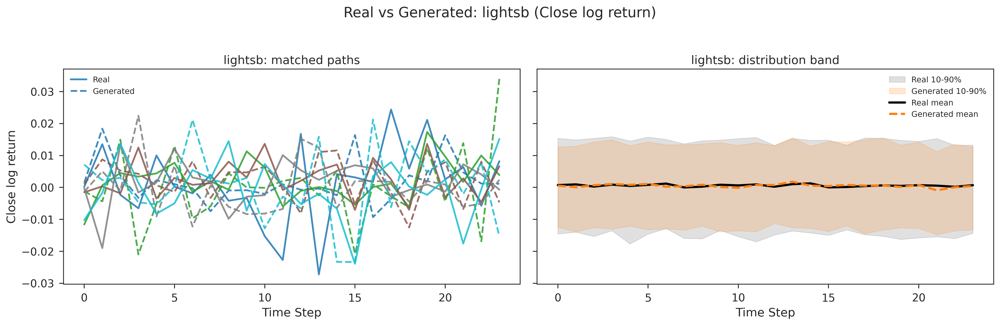

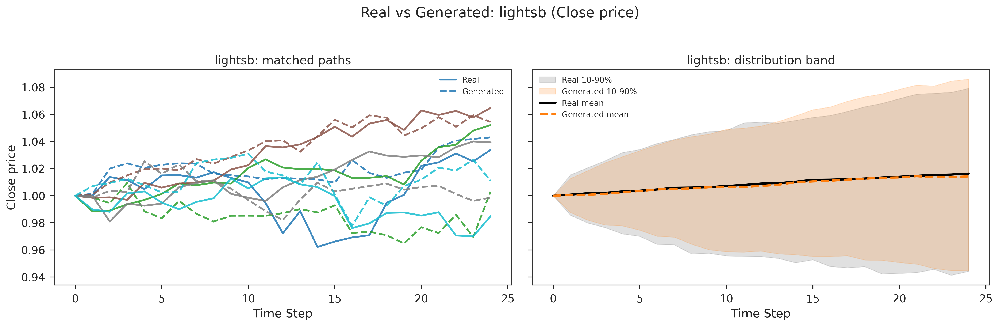

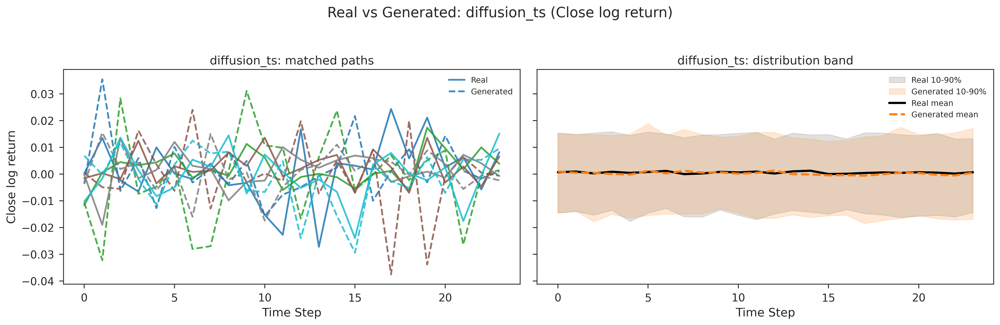

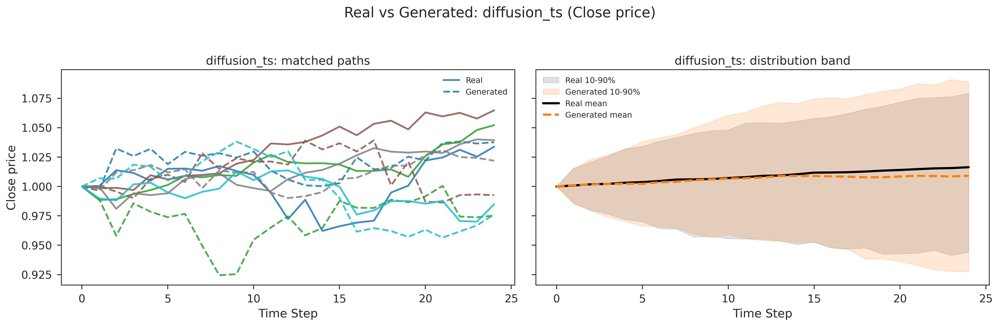

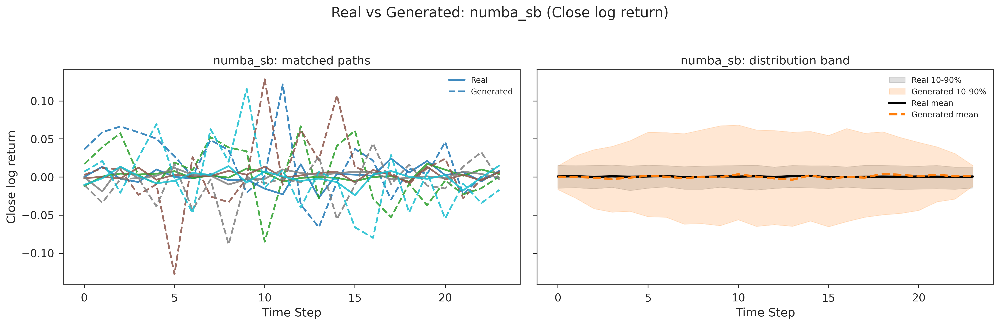

...

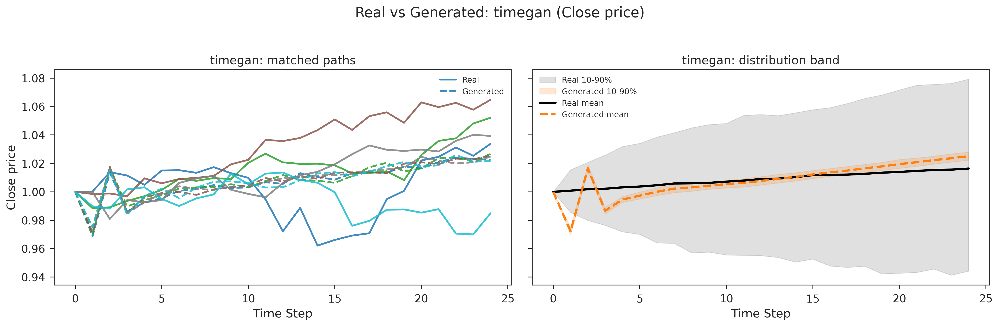

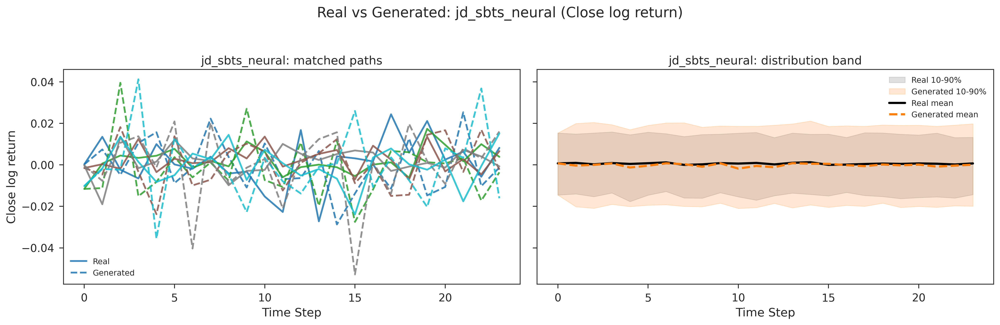

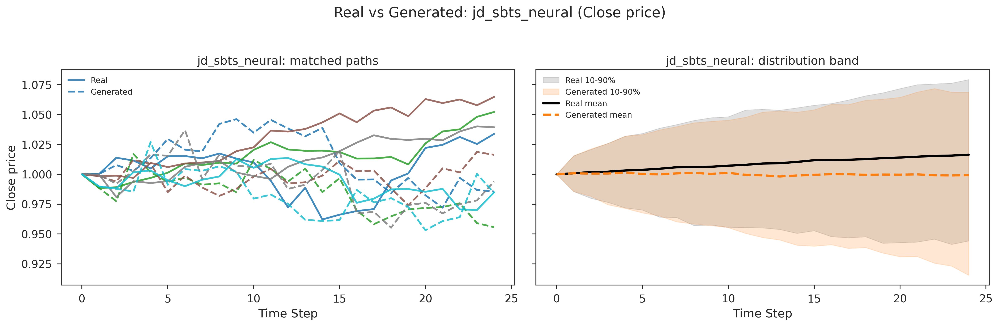

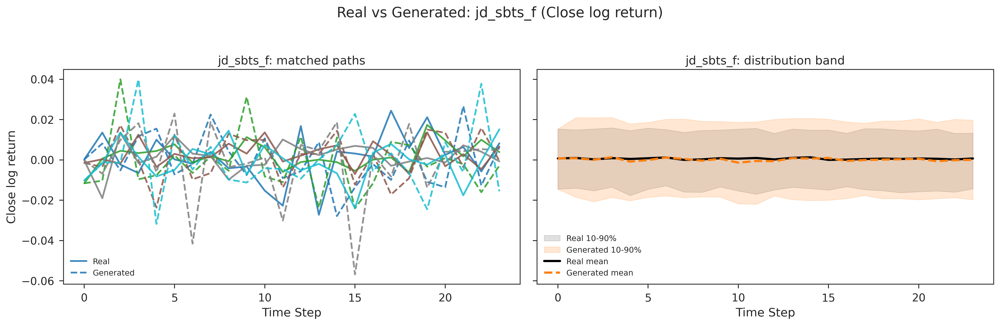

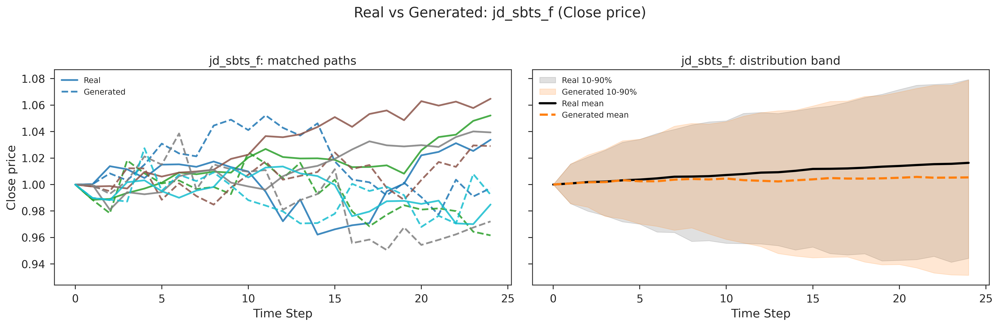

In [8]:
def _to_3d_windows(array, name):
    arr = np.asarray(array)
    if arr.ndim == 2:
        arr = arr[:, :, None]
    if arr.ndim != 3:
        raise ValueError(f'{name} must have shape (samples, steps, features), got {arr.shape}')
    return arr


def _visual_feature_names(metadata):
    report = metadata.get('download_report', {}) if isinstance(metadata, dict) else {}
    features = report.get('features')
    if features:
        return list(features)
    config = metadata.get('config', {}) if isinstance(metadata, dict) else {}
    features = config.get('features')
    return list(features) if features else None


def _resolve_visual_feature(feature, metadata, n_features):
    feature_names = _visual_feature_names(metadata)
    if isinstance(feature, str):
        if feature_names:
            lower_to_index = {name.lower(): idx for idx, name in enumerate(feature_names)}
            if feature.lower() in lower_to_index and lower_to_index[feature.lower()] < n_features:
                idx = lower_to_index[feature.lower()]
                return idx, feature_names[idx]
        if n_features == 1:
            return 0, 'feature_0'
        print(f"Feature '{feature}' was not found; using feature index 0.")
        return 0, feature_names[0] if feature_names else 'feature_0'

    idx = int(feature)
    if idx < 0 or idx >= n_features:
        print(f'Feature index {idx} is out of range for {n_features} features; using feature index 0.')
        idx = 0
    label = feature_names[idx] if feature_names and idx < len(feature_names) else f'feature_{idx}'
    return idx, label


def _comparison_model_order(generated_data, ranking_summary=None, max_models=None):
    if ranking_summary is not None:
        ordered = [name for name in ranking_summary.index if name in generated_data]
        ordered += [name for name in generated_data.keys() if name not in ordered]
    else:
        ordered = list(generated_data.keys())
    if max_models is not None:
        ordered = ordered[:int(max_models)]
    return ordered


def _safe_filename_part(value):
    return ''.join(ch if ch.isalnum() or ch in {'-', '_'} else '_' for ch in str(value)).strip('_')


def plot_real_vs_generated_paths(
    model_name,
    real_windows,
    generated_windows,
    feature_idx=0,
    feature_label='feature_0',
    n_paths=6,
    save_dir=None,
):
    real = _to_3d_windows(real_windows, 'real_windows')
    generated = _to_3d_windows(generated_windows, 'generated_windows')

    n = min(int(n_paths), len(real), len(generated))
    steps = min(real.shape[1], generated.shape[1])
    feature_idx = min(int(feature_idx), real.shape[2] - 1, generated.shape[2] - 1)
    x_axis = time_grid[:steps] if len(time_grid) >= steps else np.arange(steps)

    real_series = real[:n, :steps, feature_idx]
    gen_series = generated[:n, :steps, feature_idx]
    real_pool = real[:min(len(real), len(generated)), :steps, feature_idx]
    gen_pool = generated[:min(len(real), len(generated)), :steps, feature_idx]

    fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharex=True, sharey=True)
    colors = plt.cm.tab10(np.linspace(0, 1, max(n, 1)))

    ax = axes[0]
    for idx in range(n):
        ax.plot(x_axis, real_series[idx], color=colors[idx], linewidth=2.0, alpha=0.85, label='Real' if idx == 0 else None)
        ax.plot(x_axis, gen_series[idx], color=colors[idx], linewidth=2.0, alpha=0.85, linestyle='--', label='Generated' if idx == 0 else None)
    ax.set_title(f'{model_name}: matched paths')
    ax.set_xlabel('Time Step')
    ax.set_ylabel(feature_label)
    ax.legend(fontsize=9)

    ax = axes[1]
    real_mean = real_pool.mean(axis=0)
    gen_mean = gen_pool.mean(axis=0)
    real_q10, real_q90 = np.quantile(real_pool, [0.10, 0.90], axis=0)
    gen_q10, gen_q90 = np.quantile(gen_pool, [0.10, 0.90], axis=0)
    ax.fill_between(x_axis, real_q10, real_q90, color='black', alpha=0.12, label='Real 10-90%')
    ax.fill_between(x_axis, gen_q10, gen_q90, color='tab:orange', alpha=0.18, label='Generated 10-90%')
    ax.plot(x_axis, real_mean, color='black', linewidth=2.5, label='Real mean')
    ax.plot(x_axis, gen_mean, color='tab:orange', linewidth=2.5, linestyle='--', label='Generated mean')
    ax.set_title(f'{model_name}: distribution band')
    ax.set_xlabel('Time Step')
    ax.legend(fontsize=9)

    fig.suptitle(f'Real vs Generated: {model_name} ({feature_label})', fontsize=16, y=1.03)
    plt.tight_layout()

    if save_dir is not None:
        save_dir = Path(save_dir)
        save_dir.mkdir(parents=True, exist_ok=True)
        filename = f"real_vs_generated_{_safe_filename_part(model_name)}_{_safe_filename_part(feature_label)}.png"
        fig.savefig(save_dir / filename, dpi=150, bbox_inches='tight')

    plt.show()
    return fig


def _log_returns_to_base_one_prices(log_return_windows):
    log_returns = _to_3d_windows(log_return_windows, 'log_return_windows')
    cumulative_log_returns = np.cumsum(log_returns, axis=1)
    relative_prices = np.exp(cumulative_log_returns)
    initial_prices = np.ones((log_returns.shape[0], 1, log_returns.shape[2]), dtype=relative_prices.dtype)
    return np.concatenate([initial_prices, relative_prices], axis=1)


if generated_data:
    real_for_visuals = shared_eval_subset.copy()
    first_generated = _to_3d_windows(next(iter(generated_data.values())), 'first_generated')
    real_3d = _to_3d_windows(real_for_visuals, 'real_for_visuals')
    n_features = min(real_3d.shape[2], first_generated.shape[2])
    feature_idx, feature_label = _resolve_visual_feature(VISUAL_COMPARISON_FEATURE, metadata, n_features)
    is_log_return = metadata.get('normalization_report', {}).get('method') == 'log_return'
    model_order = _comparison_model_order(
        generated_data,
        ranking_summary=globals().get('ranking_summary'),
        max_models=VISUAL_COMPARISON_MAX_MODELS,
    )
    visual_save_dir = OUTPUT_DIR / 'visual_comparisons' if SAVE_VISUAL_COMPARISON_FIGURES else None

    visual_views = ['log return', 'price'] if is_log_return else ['price']
    print(f'Plotting {len(model_order)} model(s), views={visual_views}, feature={feature_label}, n_paths={VISUAL_COMPARISON_N_PATHS}')
    if visual_save_dir is not None:
        print(f'Saving figures to: {visual_save_dir}')

    for model_name in model_order:
        if is_log_return:
            plot_real_vs_generated_paths(
                model_name,
                real_for_visuals,
                generated_data[model_name],
                feature_idx=feature_idx,
                feature_label=f'{feature_label} log return',
                n_paths=VISUAL_COMPARISON_N_PATHS,
                save_dir=visual_save_dir,
            )
            plot_real_vs_generated_paths(
                model_name,
                _log_returns_to_base_one_prices(real_for_visuals),
                _log_returns_to_base_one_prices(generated_data[model_name]),
                feature_idx=feature_idx,
                feature_label=f'{feature_label} price',
                n_paths=VISUAL_COMPARISON_N_PATHS,
                save_dir=visual_save_dir,
            )
        else:
            plot_real_vs_generated_paths(
                model_name,
                real_for_visuals,
                generated_data[model_name],
                feature_idx=feature_idx,
                feature_label=feature_label,
                n_paths=VISUAL_COMPARISON_N_PATHS,
                save_dir=visual_save_dir,
            )
else:
    print('No generated_data available yet. Run the Train, Generate, Evaluate cell first.')


## Gaussian Quantile Plots


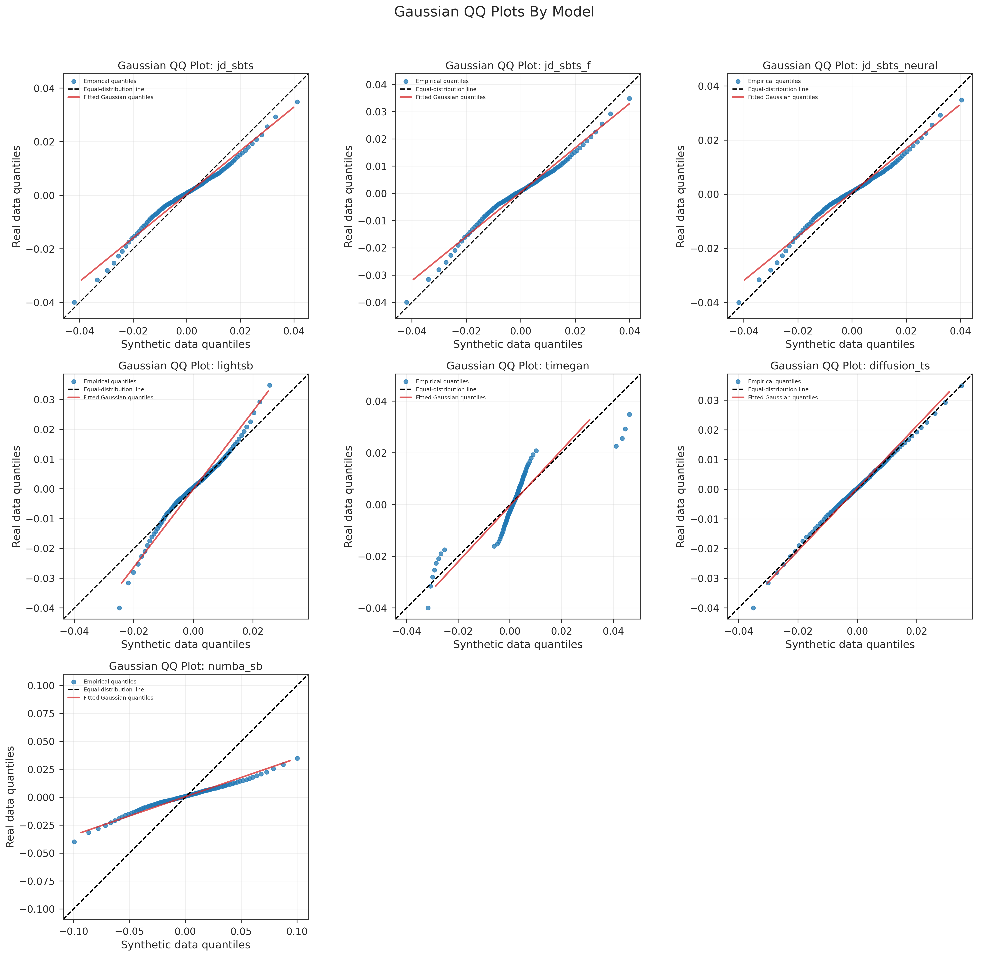

,qq_value_count,qq_quantiles,qq_corr,qq_mae_to_equal_line
model,,,,
diffusion_ts,12288,101,0.998169,0.000535
lightsb,12288,101,0.987091,0.001348
jd_sbts,12288,101,0.990869,0.003041
jd_sbts_f,12288,101,0.990852,0.003044
jd_sbts_neural,12288,101,0.990826,0.003081
timegan,12288,101,0.886837,0.004482
numba_sb,12288,101,0.991154,0.020849


In [9]:
def _qq_flatten_values(data):
    arr = np.asarray(data, dtype=np.float64)
    arr = arr[np.isfinite(arr)]
    return arr.reshape(-1)


def _normal_reference_quantiles(values, probabilities):
    values = np.asarray(values, dtype=np.float64)
    mu = float(np.mean(values))
    sigma = float(np.std(values))
    if not np.isfinite(sigma) or sigma < 1e-12:
        sigma = 1.0
    try:
        from scipy.stats import norm
        z = norm.ppf(probabilities)
    except Exception:
        rng = np.random.default_rng(SEED)
        z = np.quantile(rng.standard_normal(200_000), probabilities)
    return mu + sigma * z


def plot_model_gaussian_quantile(model_name, real_data, generated_data, n_quantiles=101, ax=None):
    real_values = _qq_flatten_values(real_data)
    gen_values = _qq_flatten_values(generated_data)
    n = min(len(real_values), len(gen_values))
    if n < 2:
        print(f'{model_name}: not enough finite values for quantile plot')
        return None

    probabilities = np.linspace(0.01, 0.99, int(n_quantiles))
    real_q = np.quantile(real_values, probabilities)
    gen_q = np.quantile(gen_values, probabilities)
    gen_gaussian_q = _normal_reference_quantiles(gen_values, probabilities)
    real_gaussian_q = _normal_reference_quantiles(real_values, probabilities)

    lo = float(np.nanmin([gen_q.min(), real_q.min(), gen_gaussian_q.min(), real_gaussian_q.min()]))
    hi = float(np.nanmax([gen_q.max(), real_q.max(), gen_gaussian_q.max(), real_gaussian_q.max()]))
    pad = 0.05 * (hi - lo) if hi > lo else 1.0
    lo -= pad
    hi += pad

    created_fig = ax is None
    if created_fig:
        fig, ax = plt.subplots(figsize=(6, 6))
    ax.scatter(gen_q, real_q, s=28, alpha=0.75, label='Empirical quantiles')
    ax.plot([lo, hi], [lo, hi], color='black', linestyle='--', linewidth=1.5, label='Equal-distribution line')
    ax.plot(gen_gaussian_q, real_gaussian_q, color='tab:red', linewidth=2, alpha=0.75, label='Fitted Gaussian quantiles')
    ax.set_xlim(lo, hi)
    ax.set_ylim(lo, hi)
    ax.set_aspect('equal', adjustable='box')
    ax.set_xlabel('Synthetic data quantiles')
    ax.set_ylabel('Real data quantiles')
    ax.set_title(f'Gaussian QQ Plot: {model_name}')
    ax.grid(alpha=0.3)
    ax.legend(fontsize=7)
    if created_fig:
        plt.tight_layout()
        plt.show()

    return {
        'model': model_name,
        'qq_value_count': int(n),
        'qq_quantiles': int(n_quantiles),
        'qq_corr': float(np.corrcoef(gen_q, real_q)[0, 1]) if len(gen_q) > 1 else np.nan,
        'qq_mae_to_equal_line': float(np.mean(np.abs(real_q - gen_q))),
    }


if generated_data:
    quantile_records = []
    qq_methods = list(generated_data.keys())
    qq_real_base = shared_eval_subset.copy()
    eval_cap = int(TRAINING_OVERRIDES.get('evaluation_sample_cap', len(qq_real_base)))
    qq_n_cols = min(3, max(1, len(qq_methods)))
    qq_n_rows = int(np.ceil(len(qq_methods) / qq_n_cols))
    qq_fig, qq_axes = plt.subplots(
        qq_n_rows,
        qq_n_cols,
        figsize=(6 * qq_n_cols, 5.5 * qq_n_rows),
        squeeze=False,
    )
    qq_axes_flat = qq_axes.reshape(-1)

    for qq_idx, model_name in enumerate(qq_methods):
        gen_paths = generated_data[model_name]
        ax = qq_axes_flat[qq_idx]
        real_eval = qq_real_base[:min(len(qq_real_base), len(gen_paths))]
        gen_eval = gen_paths[:len(real_eval)]
        if eval_cap > 0:
            real_eval = real_eval[:eval_cap]
            gen_eval = gen_eval[:eval_cap]

        record = plot_model_gaussian_quantile(
            model_name,
            real_eval,
            gen_eval,
            n_quantiles=TRAINING_OVERRIDES.get('qq_n_quantiles', 101),
            ax=ax,
        )
        if record is not None:
            quantile_records.append(record)
        else:
            ax.axis('off')

    for ax in qq_axes_flat[len(qq_methods):]:
        ax.axis('off')
    qq_fig.suptitle('Gaussian QQ Plots By Model', fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()

    if quantile_records:
        qq_summary = pd.DataFrame(quantile_records).set_index('model')
        display(qq_summary.sort_values('qq_mae_to_equal_line'))
else:
    print('No generated_data available yet. Run the Train, Generate, Evaluate cell first.')


## Main Metrics, Secondary Metrics, And Sanity Checks


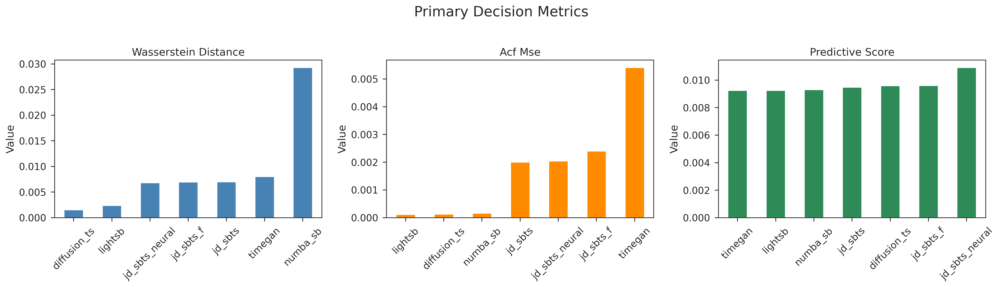

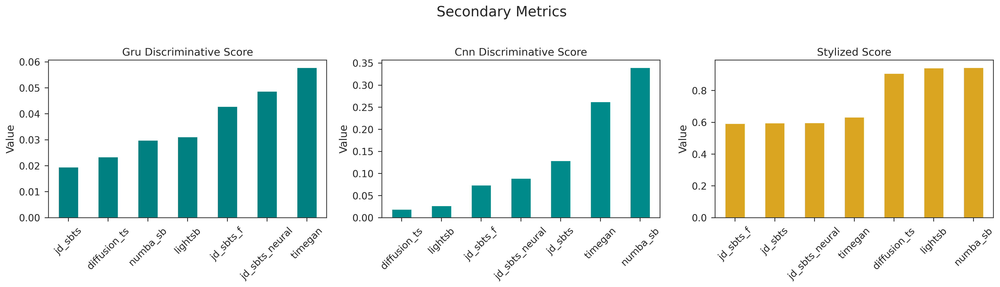

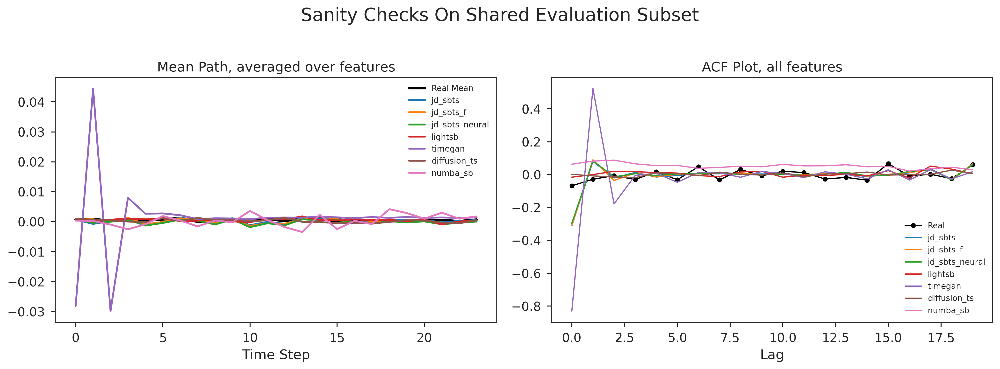

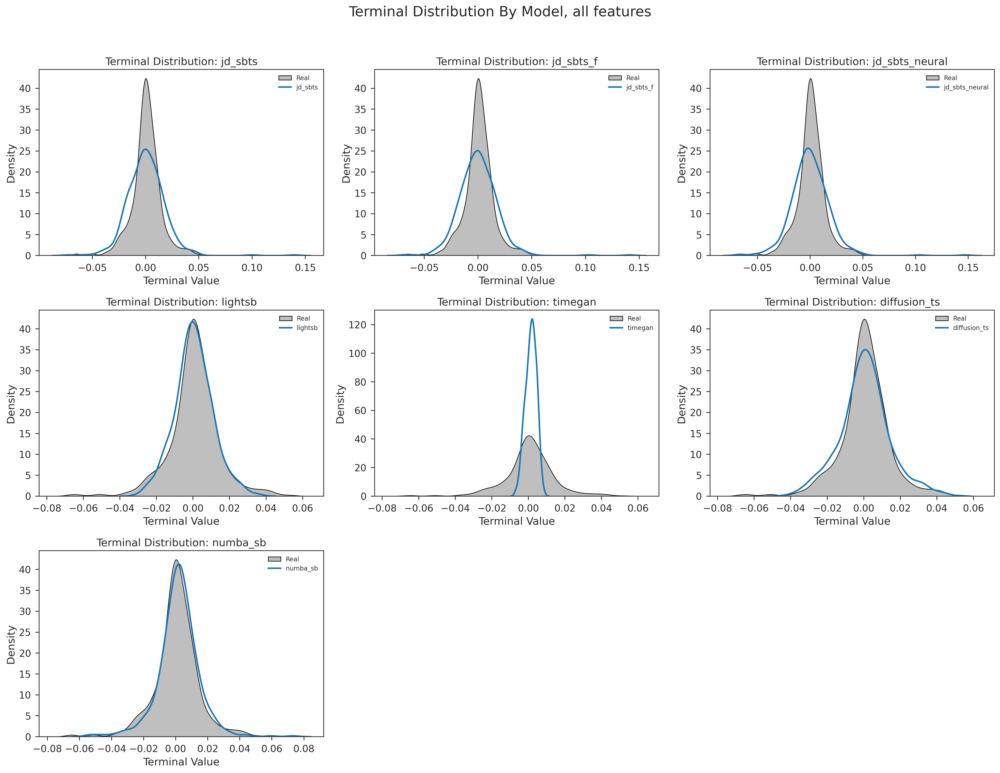

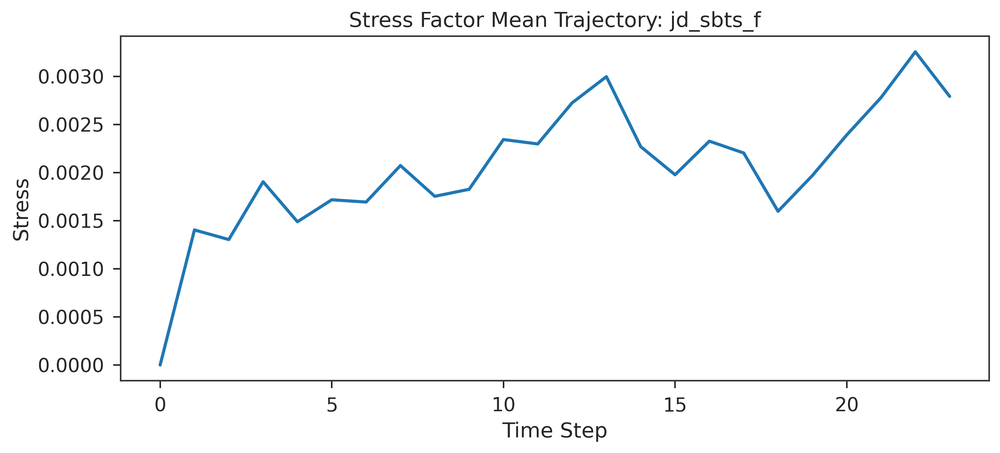

In [10]:
def plot_sorted_metric(ax, frame, column, title, color='steelblue'):
    series = frame[column].dropna().sort_values()
    series.plot(kind='bar', ax=ax, color=color)
    ax.set_title(title)
    ax.set_ylabel('Value')
    ax.tick_params(axis='x', rotation=45)


if generated_data:
    methods = list(generated_data.keys())
    sanity_subset = shared_eval_subset.copy()

    main_plot_cols = [col for col in ['wasserstein_distance', 'acf_mse', 'predictive_score'] if col in comparison_df.columns]
    main_n_cols = max(1, len(main_plot_cols))
    fig, axes = plt.subplots(1, main_n_cols, figsize=(6 * main_n_cols, 5), squeeze=False)
    colors = ['steelblue', 'darkorange', 'seagreen']
    axes_flat = axes.reshape(-1)

    for ax, col, color in zip(axes_flat, main_plot_cols, colors):
        plot_sorted_metric(ax, comparison_df, col, col.replace('_', ' ').title(), color=color)

    for ax in axes_flat[len(main_plot_cols):]:
        ax.axis('off')

    fig.suptitle('Primary Decision Metrics', fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()

    secondary_plot_cols = [
        col for col in [
            'gru_discriminative_score',
            'cnn_discriminative_score',
            'stylized_score',
        ]
        if col in comparison_df.columns
    ]
    secondary_n_cols = max(1, min(3, len(secondary_plot_cols)))
    fig, axes = plt.subplots(1, secondary_n_cols, figsize=(6 * secondary_n_cols, 5), squeeze=False)
    colors = ['teal', 'darkcyan', 'goldenrod']
    axes_flat = axes.reshape(-1)

    for ax, col, color in zip(axes_flat, secondary_plot_cols, colors):
        plot_sorted_metric(ax, comparison_df, col, col.replace('_', ' ').title(), color=color)

    for ax in axes_flat[len(secondary_plot_cols):]:
        ax.axis('off')

    fig.suptitle('Secondary Metrics', fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    ax = axes[0]
    real_mean_path = np.mean(sanity_subset, axis=(0, 2)) if sanity_subset.ndim == 3 else np.mean(sanity_subset, axis=0)
    ax.plot(real_mean_path, color='black', linewidth=2.5, label='Real Mean')
    for method in methods:
        gen_subset = generated_data[method][:len(sanity_subset)]
        gen_mean_path = np.mean(gen_subset, axis=(0, 2)) if gen_subset.ndim == 3 else np.mean(gen_subset, axis=0)
        ax.plot(gen_mean_path, linewidth=1.8, label=method)
    ax.set_title('Mean Path, averaged over features')
    ax.set_xlabel('Time Step')
    ax.legend(fontsize=8)

    ax = axes[1]
    max_lag = TRAINING_OVERRIDES['acf_max_lag']
    series = sanity_subset
    real_acf = []
    for lag in range(max_lag):
        if lag >= series.shape[1] - 1:
            real_acf.append(0.0)
        else:
            x_t = series[:, :-lag-1, :].reshape(-1) if series.ndim == 3 else series[:, :-lag-1].flatten()
            x_k = series[:, lag+1:, :].reshape(-1) if series.ndim == 3 else series[:, lag+1:].flatten()
            corr = np.corrcoef(x_t, x_k)[0, 1]
            real_acf.append(corr if np.isfinite(corr) else 0.0)
    ax.plot(range(max_lag), real_acf, color='black', marker='o', label='Real')

    for method in methods:
        series = generated_data[method][:len(sanity_subset)]
        acf_vals = []
        for lag in range(max_lag):
            if lag >= series.shape[1] - 1:
                acf_vals.append(0.0)
            else:
                x_t = series[:, :-lag-1, :].reshape(-1) if series.ndim == 3 else series[:, :-lag-1].flatten()
                x_k = series[:, lag+1:, :].reshape(-1) if series.ndim == 3 else series[:, lag+1:].flatten()
                corr = np.corrcoef(x_t, x_k)[0, 1]
                acf_vals.append(corr if np.isfinite(corr) else 0.0)
        ax.plot(range(max_lag), acf_vals, marker='x', label=method)
    ax.set_title('ACF Plot, all features')
    ax.set_xlabel('Lag')
    ax.legend(fontsize=8)

    fig.suptitle('Sanity Checks On Shared Evaluation Subset', fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()

    terminal_n_cols = min(3, max(1, len(methods)))
    terminal_n_rows = int(np.ceil(len(methods) / terminal_n_cols))
    term_fig, term_axes = plt.subplots(
        terminal_n_rows,
        terminal_n_cols,
        figsize=(6 * terminal_n_cols, 4.5 * terminal_n_rows),
        squeeze=False,
    )
    term_axes_flat = term_axes.reshape(-1)
    real_terminal = sanity_subset[:, -1, :].reshape(-1) if sanity_subset.ndim == 3 else sanity_subset[:, -1]

    for term_idx, method in enumerate(methods):
        ax = term_axes_flat[term_idx]
        gen_subset = generated_data[method][:len(sanity_subset)]
        gen_terminal = gen_subset[:, -1, :].reshape(-1) if gen_subset.ndim == 3 else gen_subset[:, -1]
        sns.kdeplot(real_terminal, ax=ax, color='black', fill=True, alpha=0.25, label='Real')
        sns.kdeplot(gen_terminal, ax=ax, linewidth=2, label=method)
        ax.set_title(f'Terminal Distribution: {method}')
        ax.set_xlabel('Terminal Value')
        ax.legend(fontsize=8)

    for ax in term_axes_flat[len(methods):]:
        ax.axis('off')

    term_fig.suptitle('Terminal Distribution By Model, all features', fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()

    if stress_trajectories:
        for model_name, stress in stress_trajectories.items():
            plt.figure(figsize=(10, 4))
            plt.plot(np.mean(stress, axis=0), linewidth=2)
            plt.title(f'Stress Factor Mean Trajectory: {model_name}')
            plt.xlabel('Time Step')
            plt.ylabel('Stress')
            plt.show()


## Jump Frequency And Magnitude Diagnostics


,jump_frequency,jump_count,jump_total_observations,jump_mean_abs_magnitude,jump_median_abs_magnitude,jump_p95_abs_magnitude
model,,,,,,
real,0.020508,252,12288,0.052051,0.045887,0.093824
jd_sbts,0.027425,337,12288,0.054731,0.046002,0.100165
jd_sbts_f,0.027181,334,12288,0.054650,0.046307,0.103301
jd_sbts_neural,0.027751,341,12288,0.054398,0.045585,0.102298
lightsb,0.000651,8,12288,0.041165,0.041101,0.044283
timegan,0.041667,512,12288,0.044499,0.044530,0.047653
diffusion_ts,0.015299,188,12288,0.045087,0.042971,0.057912
numba_sb,0.322021,3957,12288,0.061743,0.056333,0.102679


Jump threshold: abs(value) > 0.0375718 using 4.0 robust std from real data


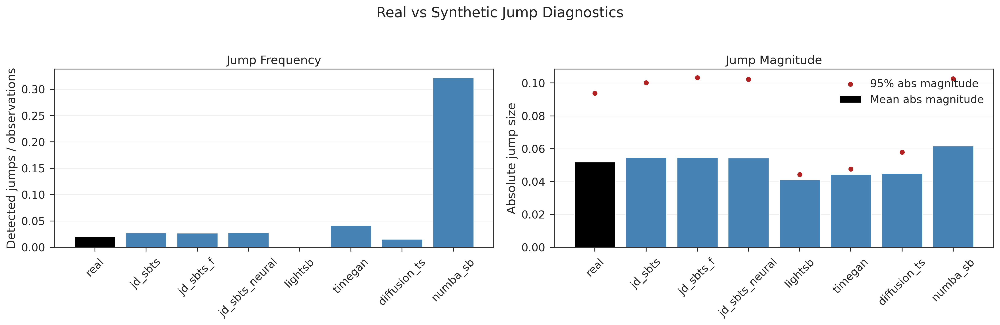

In [11]:
def _jump_observations_for_diagnostics(windows):
    arr = np.asarray(windows, dtype=np.float64)
    if arr.ndim == 2:
        arr = arr[:, :, None]
    if arr.ndim != 3:
        raise ValueError(f'Expected 2D or 3D windows, got shape {arr.shape}')

    normalization_method = metadata.get('normalization_report', {}).get('method')
    if normalization_method == 'log_return':
        jump_obs = arr
    else:
        jump_obs = np.diff(arr, axis=1)
    return jump_obs[np.isfinite(jump_obs)]


def _robust_jump_threshold(values, threshold_std=4.0):
    values = np.asarray(values, dtype=np.float64)
    values = values[np.isfinite(values)]
    if len(values) == 0:
        return np.nan
    centered = values - np.median(values)
    robust_sigma = np.median(np.abs(centered)) / 0.6745
    if not np.isfinite(robust_sigma) or robust_sigma < 1e-12:
        robust_sigma = np.std(values)
    if not np.isfinite(robust_sigma) or robust_sigma < 1e-12:
        robust_sigma = 1.0
    return float(threshold_std * robust_sigma)


def compute_jump_diagnostics(windows, threshold):
    values = _jump_observations_for_diagnostics(windows)
    abs_values = np.abs(values)
    jump_mask = abs_values > threshold
    jump_values = abs_values[jump_mask]
    total_n = int(len(abs_values))
    jump_n = int(np.sum(jump_mask))
    return {
        'jump_frequency': float(jump_n / total_n) if total_n else np.nan,
        'jump_count': jump_n,
        'jump_total_observations': total_n,
        'jump_mean_abs_magnitude': float(np.mean(jump_values)) if jump_n else 0.0,
        'jump_median_abs_magnitude': float(np.median(jump_values)) if jump_n else 0.0,
        'jump_p95_abs_magnitude': float(np.quantile(jump_values, 0.95)) if jump_n else 0.0,
    }


if generated_data:
    jump_real_base = shared_eval_subset.copy()
    eval_cap = int(TRAINING_OVERRIDES.get('evaluation_sample_cap', len(jump_real_base)))
    threshold_std = float(TRAINING_OVERRIDES.get('jump_diagnostic_threshold_std', 4.0))
    real_threshold_values = _jump_observations_for_diagnostics(jump_real_base[:eval_cap] if eval_cap > 0 else jump_real_base)
    jump_threshold = _robust_jump_threshold(real_threshold_values, threshold_std=threshold_std)

    jump_records = []
    real_reference = jump_real_base[:eval_cap] if eval_cap > 0 else jump_real_base
    real_stats = compute_jump_diagnostics(real_reference, jump_threshold)
    jump_records.append({'model': 'real', **real_stats})

    for model_name, gen_paths in generated_data.items():
        real_eval = jump_real_base[:min(len(jump_real_base), len(gen_paths))]
        gen_eval = gen_paths[:len(real_eval)]
        if eval_cap > 0:
            gen_eval = gen_eval[:eval_cap]
        model_stats = compute_jump_diagnostics(gen_eval, jump_threshold)
        jump_records.append({'model': model_name, **model_stats})

    jump_summary = pd.DataFrame(jump_records).set_index('model')
    display(jump_summary)
    print(f'Jump threshold: abs(value) > {jump_threshold:.6g} using {threshold_std:.1f} robust std from real data')

    plot_frame = jump_summary.reset_index()
    model_order = plot_frame['model'].tolist()
    colors = ['black' if name == 'real' else 'steelblue' for name in model_order]

    fig, axes = plt.subplots(1, 2, figsize=(16, 5))

    axes[0].bar(plot_frame['model'], plot_frame['jump_frequency'], color=colors)
    axes[0].set_title('Jump Frequency')
    axes[0].set_ylabel('Detected jumps / observations')
    axes[0].tick_params(axis='x', rotation=45)
    axes[0].grid(axis='y', alpha=0.3)

    axes[1].bar(plot_frame['model'], plot_frame['jump_mean_abs_magnitude'], color=colors, label='Mean abs magnitude')
    axes[1].scatter(plot_frame['model'], plot_frame['jump_p95_abs_magnitude'], color='firebrick', zorder=3, label='95% abs magnitude')
    axes[1].set_title('Jump Magnitude')
    axes[1].set_ylabel('Absolute jump size')
    axes[1].tick_params(axis='x', rotation=45)
    axes[1].grid(axis='y', alpha=0.3)
    axes[1].legend()

    fig.suptitle('Real vs Synthetic Jump Diagnostics', fontsize=16, y=1.03)
    plt.tight_layout()
    plt.show()
else:
    print('No generated_data available yet. Run the Train, Generate, Evaluate cell first.')


## Save Results To `./results`

Run this final cell after training/evaluation. It saves generated samples, stress trajectories, metric tables, ranking tables, diagnostics, and run metadata under `./results`.


In [12]:
# Save benchmark artifacts to ./results
import shutil
from datetime import datetime

RESULTS_DIR = PROJECT_ROOT / 'results_QQQ'
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

ARRAY_DIR = RESULTS_DIR / 'arrays'
GENERATED_DIR = RESULTS_DIR / 'generated'
STRESS_DIR = RESULTS_DIR / 'stress'
TABLE_DIR = RESULTS_DIR / 'tables'
FIGURE_DIR = RESULTS_DIR / 'figures'
MODEL_DIR = RESULTS_DIR / 'models'

for _dir in [ARRAY_DIR, GENERATED_DIR, STRESS_DIR, TABLE_DIR, FIGURE_DIR, MODEL_DIR]:
    _dir.mkdir(parents=True, exist_ok=True)


def _results_json_default(value):
    if '_json_default' in globals():
        try:
            return _json_default(value)
        except TypeError:
            pass
    if isinstance(value, Path):
        return str(value)
    if isinstance(value, (np.integer, np.floating, np.bool_)):
        return value.item()
    if isinstance(value, np.ndarray):
        return value.tolist()
    if isinstance(value, pd.DataFrame):
        return value.reset_index().to_dict(orient='records')
    if isinstance(value, pd.Series):
        return value.to_dict()
    if isinstance(value, (set, tuple)):
        return list(value)
    return str(value)


def _safe_result_name(name):
    if '_safe_filename_part' in globals():
        return _safe_filename_part(str(name))
    return ''.join(ch if ch.isalnum() or ch in {'-', '_'} else '_' for ch in str(name)).strip('_') or 'item'


def _save_json(path, payload):
    with open(path, 'w') as f:
        json.dump(payload, f, indent=2, default=_results_json_default)


def _save_dataframe(name, frame):
    if frame is None:
        return []
    frame = pd.DataFrame(frame)
    csv_path = TABLE_DIR / f'{name}.csv'
    json_path = TABLE_DIR / f'{name}.json'
    frame.to_csv(csv_path)
    frame.to_json(json_path, orient='table', indent=2)
    return [str(csv_path), str(json_path)]

saved_files = []

# Core arrays used for fair evaluation.
if 'data' in globals():
    path = ARRAY_DIR / 'train_windows.npy'
    np.save(path, data)
    saved_files.append(str(path))
if 'shared_eval_subset' in globals():
    path = ARRAY_DIR / 'shared_eval_subset.npy'
    np.save(path, shared_eval_subset)
    saved_files.append(str(path))
if 'time_grid' in globals():
    path = ARRAY_DIR / 'time_grid.npy'
    np.save(path, time_grid)
    saved_files.append(str(path))
if 'data_splits' in globals():
    split_payload = {k: np.asarray(v) for k, v in data_splits.items() if k in {'train', 'val', 'test'}}
    if split_payload:
        path = ARRAY_DIR / 'data_splits.npz'
        np.savez_compressed(path, **split_payload)
        saved_files.append(str(path))

# Generated samples and stress paths.
generated_name_map = {}
if 'generated_data' in globals() and generated_data:
    compressed_payload = {}
    for model_name, values in generated_data.items():
        safe_name = _safe_result_name(model_name)
        generated_name_map[model_name] = safe_name
        arr = np.asarray(values)
        path = GENERATED_DIR / f'{safe_name}.npy'
        np.save(path, arr)
        compressed_payload[safe_name] = arr
        saved_files.append(str(path))
    path = RESULTS_DIR / 'generated_data.npz'
    np.savez_compressed(path, **compressed_payload)
    saved_files.append(str(path))
    path = RESULTS_DIR / 'generated_name_map.json'
    _save_json(path, generated_name_map)
    saved_files.append(str(path))

stress_name_map = {}
if 'stress_trajectories' in globals() and stress_trajectories:
    compressed_payload = {}
    for model_name, values in stress_trajectories.items():
        safe_name = _safe_result_name(model_name)
        stress_name_map[model_name] = safe_name
        arr = np.asarray(values)
        path = STRESS_DIR / f'{safe_name}_stress.npy'
        np.save(path, arr)
        compressed_payload[f'{safe_name}_stress'] = arr
        saved_files.append(str(path))
    path = RESULTS_DIR / 'stress_trajectories.npz'
    np.savez_compressed(path, **compressed_payload)
    saved_files.append(str(path))

# Metric and diagnostic tables.
if 'metrics_results' in globals() and metrics_results and 'df_metrics' not in globals():
    df_metrics = pd.DataFrame(metrics_results).T.sort_index()

for table_name in [
    'df_metrics',
    'comparison_df',
    'ranking_summary',
    'jump_summary',
    'protocol_df',
]:
    if table_name in globals():
        saved_files.extend(_save_dataframe(table_name, globals()[table_name]))

# Raw dictionaries and run metadata.
for dict_name in [
    'metrics_results',
    'turing_test_results',
    'training_times',
    'generation_times',
    'generation_protocols',
    'fairness_notes',
    'failures',
]:
    if dict_name in globals():
        path = RESULTS_DIR / f'{dict_name}.json'
        _save_json(path, globals()[dict_name])
        saved_files.append(str(path))

model_training_metrics = {}
if 'trained_models' in globals() and trained_models:
    for model_name, model in trained_models.items():
        if hasattr(model, 'get_training_metrics'):
            model_training_metrics[model_name] = model.get_training_metrics()
    if model_training_metrics:
        path = RESULTS_DIR / 'model_training_metrics.json'
        _save_json(path, model_training_metrics)
        saved_files.append(str(path))

# Best-effort model pickles. Some model objects may not be pickleable; failures are recorded.
model_pickle_status = {}
if 'trained_models' in globals() and trained_models:
    import pickle
    for model_name, model in trained_models.items():
        safe_name = _safe_result_name(model_name)
        path = MODEL_DIR / f'{safe_name}.pkl'
        try:
            with open(path, 'wb') as f:
                pickle.dump(model, f)
            model_pickle_status[model_name] = str(path)
            saved_files.append(str(path))
        except Exception as exc:
            model_pickle_status[model_name] = f'not_saved: {exc}'
    path = MODEL_DIR / 'pickle_status.json'
    _save_json(path, model_pickle_status)
    saved_files.append(str(path))

# Copy already-saved visual comparison figures into ./results/figures when available.
if 'visual_save_dir' in globals() and visual_save_dir is not None and Path(visual_save_dir).exists():
    for src in Path(visual_save_dir).glob('*.png'):
        dst = FIGURE_DIR / src.name
        shutil.copy2(src, dst)
        saved_files.append(str(dst))

run_snapshot = {
    'saved_at': datetime.now().isoformat(timespec='seconds'),
    'project_root': str(PROJECT_ROOT),
    'results_dir': str(RESULTS_DIR),
    'seed': globals().get('SEED'),
    'benchmark_dataset': globals().get('BENCHMARK_DATASET'),
    'stock_ticker': globals().get('STOCK_TICKER'),
    'models_to_run': globals().get('MODELS_TO_RUN'),
    'training_overrides': globals().get('TRAINING_OVERRIDES'),
    'fair_comparison': globals().get('FAIR_COMPARISON'),
    'metadata': globals().get('metadata'),
    'generated_name_map': generated_name_map,
    'stress_name_map': stress_name_map,
    'model_pickle_status': model_pickle_status,
    'saved_files': saved_files,
}
path = RESULTS_DIR / 'run_snapshot.json'
_save_json(path, run_snapshot)
saved_files.append(str(path))

print(f'Saved {len(saved_files)} result artifacts to: {RESULTS_DIR}')
for item in saved_files[:40]:
    print(' -', item)
if len(saved_files) > 40:
    print(f' ... and {len(saved_files) - 40} more files')


Saved 81 result artifacts to: /home/wan/psc/sbts_advanced/results_QQQ
 - /home/wan/psc/sbts_advanced/results_QQQ/arrays/train_windows.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/arrays/shared_eval_subset.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/arrays/time_grid.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/arrays/data_splits.npz
 - /home/wan/psc/sbts_advanced/results_QQQ/generated/jd_sbts.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/generated/jd_sbts_f.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/generated/jd_sbts_neural.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/generated/lightsb.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/generated/timegan.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/generated/diffusion_ts.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/generated/numba_sb.npy
 - /home/wan/psc/sbts_advanced/results_QQQ/generated_data.npz
 - /home/wan/psc/sbts_advanced/results_QQQ/generated_name_map.json
 - /home/wan/psc/sbts_advanced/results_QQQ/stress/jd_sbts_f_